# LightGBM

In [14]:
import numpy as np
import pandas as pd
from IPython.display import display, HTML
import importlib

import plotly.express as px
import matplotlib.pyplot as plt
import statsmodels.api as sm

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

import warnings
import os
import pickle

warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:,.2f}'.format

In [15]:
df_main = pd.read_excel("https://raw.githubusercontent.com/carrenogf/MCD-Series-Temporales/main/dataset/series_diarias.xlsx")
df_main = df_main.sort_values("FECHA",ascending=True)
df_main.set_index("FECHA", inplace=True)
df_copa = df_main["CHU_COPA_AJUST"].dropna()
df_recprop = df_main["CHU_REC_PROPIOS_AJUST"].dropna()
df_regal = df_main["CHU_REGALIAS_AJUST"].dropna()
dataframes = [df_copa, df_recprop, df_regal]
titulos = ["CHU_COPA_AJUST", "CHU_REC_PROPIOS_AJUST", "CHU_REGALIAS_AJUST"]

In [16]:
# Verifica y convierte el índice a DatetimeIndex si es necesario
# dataframes[0].index = pd.to_datetime(dataframes[0].index)

# Define una función que extrae las características
def extract_time_features(index):
    return pd.Series({
        'dayofweek': index.dayofweek,
        'quarter': index.quarter,
        'month': index.month,
        'year': index.year,
        'dayofyear': index.dayofyear,
        'dayofmonth': index.day,
        'weekofyear': index.isocalendar().week
    })


def add_lags(df):
    target_map = df['CHU_COPA_AJUST'].to_dict()
    df['lag1'] = (df.index - pd.Timedelta('364 days')).map(target_map)
    df['lag2'] = (df.index - pd.Timedelta('728 days')).map(target_map)
    df['lag3'] = (df.index - pd.Timedelta('1092 days')).map(target_map)
    return df


In [17]:
# Aplica la función al índice y concatena los resultados al DataFrame
time_features = dataframes[0].index.to_series().apply(extract_time_features)
dataframes[0] = pd.concat([dataframes[0], time_features], axis=1)

dataframes[0] = add_lags(dataframes[0])

In [18]:
dataframes[0].head()

,CHU_COPA_AJUST,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
FECHA,,,,,,,,,,,
2018-01-02,"1,211,928.17",1,1,1,2018,2,2,1,NaN,NaN,NaN
2018-01-03,"2,830,481.92",2,1,1,2018,3,3,1,NaN,NaN,NaN
2018-01-04,"387,205.10",3,1,1,2018,4,4,1,NaN,NaN,NaN
2018-01-05,"695,554.06",4,1,1,2018,5,5,1,NaN,NaN,NaN
2018-01-08,"862,726.10",0,1,1,2018,8,8,2,NaN,NaN,NaN


In [19]:
# TRAIN TEST
train_copa = dataframes[0].iloc[:round(len(dataframes[0])*.8)]
test_copa = dataframes[0].iloc[round(len(dataframes[0])*.8):]
print(f"Coparticipacion: train({train_copa.shape}), test({test_copa.shape})")

train_recursos = dataframes[1].iloc[:round(len(dataframes[1])*.8)]
test_recursos = dataframes[1].iloc[round(len(dataframes[1])*.8):]
print(f"Recursos: train({train_recursos.shape}), test({test_recursos.shape})")

train_regalias = dataframes[2].iloc[:round(len(dataframes[2])*.8)]
test_regalias = dataframes[2].iloc[round(len(dataframes[2])*.8):]
print(f"Regalias: train({train_regalias.shape}), test({test_regalias.shape})")

dataframes_train = [ train_copa, train_recursos, train_regalias ]
dataframes_test = [ test_copa, test_recursos, test_regalias ]

Coparticipacion: train((1275, 11)), test((319, 11))
Recursos: train((1626,)), test((406,))
Regalias: train((460,)), test((115,))


In [22]:
FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear' , 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
TARGET = 'CHU_COPA_AJUST'

In [23]:
X_train = dataframes_train[0][FEATURES]
y_train = dataframes_train[0][TARGET]

X_test = dataframes_test[0][FEATURES]
y_test = dataframes_test[0][TARGET]

In [ ]:
# Separamos los datos usando cross validation
from sklearn.model_selection import TimeSeriesSplit
import lightgbm as lgb 
import xgboost as xgb  
from sklearn.model_selection import KFold


import optuna

def objective(trial):
    param = {
        "n_estimators": 2000,
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 100),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 0.01, 1.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 0.01, 1.0),
    }

    model = lgb.LGBMRegressor(**param, early_stopping_rounds=50, eval_metric="rmse")
    model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)])








    # Puedes usar la métrica de tu preferencia aquí
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    return rmse

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=100)




[I 2024-11-17 10:01:59,229] A new study created in memory with name: no-name-6cd148b7-8503-4e5b-ad84-af34749442a2
[I 2024-11-17 10:01:59,334] Trial 0 finished with value: 1554279.9343881058 and parameters: {'learning_rate': 0.09083051866187868, 'max_depth': 3, 'num_leaves': 84, 'min_child_samples': 64, 'subsample': 0.6690387150305305, 'colsample_bytree': 0.9635803765403937, 'reg_alpha': 0.03574701160572331, 'reg_lambda': 0.17570963247379848}. Best is trial 0 with value: 1554279.9343881058.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:01:59,664] Trial 1 finished with value: 1573330.7535546399 and parameters: {'learning_rate': 0.006136813728416381, 'max_depth': 3, 'num_leaves': 57, 'min_child_samples': 18, 'subsample': 0.522038858294521, 'colsample_bytree': 0.5311345214404147, 'reg_alpha': 0.10569681122867364, 'reg_lambda': 0.0219459508259157}. Best is trial 0 with value: 1554279.9343881058.
[I 2024-11-17 10:01:59,780] Trial 2 finished with value: 1541906.7749521204 and parameters: {'learning_rate': 0.028922194764114666, 'max_depth': 6, 'num_leaves': 106, 'min_child_samples': 94, 'subsample': 0.5666295595683577, 'colsample_bytree': 0.5806917835877315, 'reg_alpha': 0.2557156864324056, 'reg_lambda': 0.9204538324406799}. Best is trial 2 with value: 1541906.7749521204.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:01:59,914] Trial 3 finished with value: 1542737.0682353189 and parameters: {'learning_rate': 0.02131368695841747, 'max_depth': 4, 'num_leaves': 49, 'min_child_samples': 41, 'subsample': 0.7349452661357316, 'colsample_bytree': 0.7467924726139101, 'reg_alpha': 0.08897111787054862, 'reg_lambda': 0.09501178415622132}. Best is trial 2 with value: 1541906.7749521204.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:01,514] Trial 4 finished with value: 1526283.6395937756 and parameters: {'learning_rate': 0.0016105966436308228, 'max_depth': 8, 'num_leaves': 75, 'min_child_samples': 54, 'subsample': 0.5217881119884593, 'colsample_bytree': 0.7239212874315849, 'reg_alpha': 0.02515638805297764, 'reg_lambda': 0.11749717116115174}. Best is trial 4 with value: 1526283.6395937756.
[I 2024-11-17 10:02:01,618] Trial 5 finished with value: 1516173.5232869284 and parameters: {'learning_rate': 0.05058015279512285, 'max_depth': 10, 'num_leaves': 127, 'min_child_samples': 50, 'subsample': 0.5201064515468684, 'colsample_bytree': 0.8546436445828837, 'reg_alpha': 0.23004731842401654, 'reg_lambda': 0.011126585562869462}. Best is trial 5 with value: 1516173.5232869284.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:01,785] Trial 6 finished with value: 1553004.4906433758 and parameters: {'learning_rate': 0.027318487438749345, 'max_depth': 6, 'num_leaves': 115, 'min_child_samples': 27, 'subsample': 0.7083023752103268, 'colsample_bytree': 0.6795315537301989, 'reg_alpha': 0.0628094070932493, 'reg_lambda': 0.7437836071905446}. Best is trial 5 with value: 1516173.5232869284.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:02,658] Trial 7 finished with value: 1567873.9868616955 and parameters: {'learning_rate': 0.0012149014857622245, 'max_depth': 3, 'num_leaves': 101, 'min_child_samples': 83, 'subsample': 0.5699056735476735, 'colsample_bytree': 0.8165539483308859, 'reg_alpha': 0.016925851880269044, 'reg_lambda': 0.10325261021880233}. Best is trial 5 with value: 1516173.5232869284.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:02,993] Trial 8 finished with value: 1527808.731526586 and parameters: {'learning_rate': 0.009204264126188183, 'max_depth': 6, 'num_leaves': 141, 'min_child_samples': 86, 'subsample': 0.8719023058490192, 'colsample_bytree': 0.9293826309432415, 'reg_alpha': 0.15578655602541294, 'reg_lambda': 0.301521484170398}. Best is trial 5 with value: 1516173.5232869284.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:03,387] Trial 9 finished with value: 1538686.4589551298 and parameters: {'learning_rate': 0.004143492717757431, 'max_depth': 9, 'num_leaves': 20, 'min_child_samples': 32, 'subsample': 0.9716318034708266, 'colsample_bytree': 0.8723820914088071, 'reg_alpha': 0.21267167160337563, 'reg_lambda': 0.15012193231269796}. Best is trial 5 with value: 1516173.5232869284.
[I 2024-11-17 10:02:03,517] Trial 10 finished with value: 1518414.1911504467 and parameters: {'learning_rate': 0.0921287796499371, 'max_depth': 10, 'num_leaves': 149, 'min_child_samples': 66, 'subsample': 0.8271797528692059, 'colsample_bytree': 0.9988606585376004, 'reg_alpha': 0.796121077302086, 'reg_lambda': 0.013940143600894234}. Best is trial 5 with value: 1516173.5232869284.


Early stopping, best iteration is:
[537]	training's l2: 1.20223e+12	valid_1's l2: 2.36756e+12
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training

[I 2024-11-17 10:02:03,656] Trial 11 finished with value: 1518556.060479996 and parameters: {'learning_rate': 0.0837481243481487, 'max_depth': 10, 'num_leaves': 147, 'min_child_samples': 65, 'subsample': 0.8387330944225594, 'colsample_bytree': 0.9868298174782829, 'reg_alpha': 0.8695805115041852, 'reg_lambda': 0.010316726424440668}. Best is trial 5 with value: 1516173.5232869284.
[I 2024-11-17 10:02:03,790] Trial 12 finished with value: 1511669.2423545192 and parameters: {'learning_rate': 0.04714982323007908, 'max_depth': 10, 'num_leaves': 131, 'min_child_samples': 49, 'subsample': 0.8249460287726496, 'colsample_bytree': 0.8505960196936846, 'reg_alpha': 0.7472832764991809, 'reg_lambda': 0.029182657010398978}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:03,954] Trial 13 finished with value: 1541627.1701716487 and parameters: {'learning_rate': 0.04247198494689154, 'max_depth': 8, 'num_leaves': 124, 'min_child_samples': 47, 'subsample': 0.6423365354716649, 'colsample_bytree': 0.8343865630460228, 'reg_alpha': 0.38679511690186763, 'reg_lambda': 0.03541027214427278}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:04,208] Trial 14 finished with value: 1525233.265809278 and parameters: {'learning_rate': 0.015787931566994002, 'max_depth': 8, 'num_leaves': 128, 'min_child_samples': 39, 'subsample': 0.9315502874895147, 'colsample_bytree': 0.8948786452053897, 'reg_alpha': 0.45027034236160884, 'reg_lambda': 0.04251854093722849}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:04,441] Trial 15 finished with value: 1552457.0877752528 and parameters: {'learning_rate': 0.04736491484556516, 'max_depth': 9, 'num_leaves': 98, 'min_child_samples': 11, 'subsample': 0.7899024002103094, 'colsample_bytree': 0.8161810938392997, 'reg_alpha': 0.4991201029644576, 'reg_lambda': 0.04250051062734259}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:04,579] Trial 16 finished with value: 1544299.9012860206 and parameters: {'learning_rate': 0.051914359182070116, 'max_depth': 10, 'num_leaves': 131, 'min_child_samples': 54, 'subsample': 0.8969498464044923, 'colsample_bytree': 0.6775142843619634, 'reg_alpha': 0.301697787574179, 'reg_lambda': 0.02043482808209652}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:04,824] Trial 17 finished with value: 1527082.5342572315 and parameters: {'learning_rate': 0.01163250946165144, 'max_depth': 7, 'num_leaves': 115, 'min_child_samples': 70, 'subsample': 0.7708882409952367, 'colsample_bytree': 0.7886043315173832, 'reg_alpha': 0.6401602365031632, 'reg_lambda': 0.023539616870022723}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:05,090] Trial 18 finished with value: 1536403.1255488335 and parameters: {'learning_rate': 0.053226515134959906, 'max_depth': 9, 'num_leaves': 135, 'min_child_samples': 30, 'subsample': 0.6339082112594641, 'colsample_bytree': 0.8827692505093385, 'reg_alpha': 0.15289481865590412, 'reg_lambda': 0.05611001167764489}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:05,765] Trial 19 finished with value: 1526298.635106644 and parameters: {'learning_rate': 0.0029182106891924874, 'max_depth': 5, 'num_leaves': 86, 'min_child_samples': 74, 'subsample': 0.6964863400771202, 'colsample_bytree': 0.9142946499165183, 'reg_alpha': 0.058792757902155636, 'reg_lambda': 0.011953727364556677}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:06,000] Trial 20 finished with value: 1549865.3240490286 and parameters: {'learning_rate': 0.017501030080073594, 'max_depth': 7, 'num_leaves': 120, 'min_child_samples': 47, 'subsample': 0.5996403274367675, 'colsample_bytree': 0.6931883758103732, 'reg_alpha': 0.17302946087447613, 'reg_lambda': 0.01750150819602918}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:06,176] Trial 21 finished with value: 1516220.415913663 and parameters: {'learning_rate': 0.09468312336748105, 'max_depth': 10, 'num_leaves': 148, 'min_child_samples': 60, 'subsample': 0.8276575778218335, 'colsample_bytree': 0.9907985492927344, 'reg_alpha': 0.9081449247818334, 'reg_lambda': 0.013992469918104902}. Best is trial 12 with value: 1511669.2423545192.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No furth

[I 2024-11-17 10:02:06,367] Trial 22 finished with value: 1507069.8744057154 and parameters: {'learning_rate': 0.03128236799704818, 'max_depth': 10, 'num_leaves': 141, 'min_child_samples': 58, 'subsample': 0.8144966278021349, 'colsample_bytree': 0.9507978532455016, 'reg_alpha': 0.9879408647025731, 'reg_lambda': 0.024136469801913234}. Best is trial 22 with value: 1507069.8744057154.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:06,521] Trial 23 finished with value: 1519001.3921398264 and parameters: {'learning_rate': 0.03299889234422232, 'max_depth': 9, 'num_leaves': 134, 'min_child_samples': 49, 'subsample': 0.7817366127649376, 'colsample_bytree': 0.8595690213237266, 'reg_alpha': 0.5590431113980912, 'reg_lambda': 0.030766717817652157}. Best is trial 22 with value: 1507069.8744057154.
[I 2024-11-17 10:02:06,647] Trial 24 finished with value: 1523129.2765266239 and parameters: {'learning_rate': 0.06652573400520867, 'max_depth': 10, 'num_leaves': 113, 'min_child_samples': 77, 'subsample': 0.8866185819820028, 'colsample_bytree': 0.9373477064551395, 'reg_alpha': 0.3331487653462862, 'reg_lambda': 0.06595997214384457}. Best is trial 22 with value: 1507069.8744057154.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:06,841] Trial 25 finished with value: 1550422.4169429874 and parameters: {'learning_rate': 0.0352628434103777, 'max_depth': 9, 'num_leaves': 138, 'min_child_samples': 39, 'subsample': 0.7499552171558862, 'colsample_bytree': 0.8036378135713017, 'reg_alpha': 0.9535842006787253, 'reg_lambda': 0.027055965186539452}. Best is trial 22 with value: 1507069.8744057154.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:07,029] Trial 26 finished with value: 1521375.0448763713 and parameters: {'learning_rate': 0.02088068422017726, 'max_depth': 8, 'num_leaves': 92, 'min_child_samples': 59, 'subsample': 0.9856883528680618, 'colsample_bytree': 0.7746776437764932, 'reg_alpha': 0.5008208916668919, 'reg_lambda': 0.010029027089668493}. Best is trial 22 with value: 1507069.8744057154.
[I 2024-11-17 10:02:07,178] Trial 27 finished with value: 1505356.4121649398 and parameters: {'learning_rate': 0.06638421073080322, 'max_depth': 10, 'num_leaves': 125, 'min_child_samples': 52, 'subsample': 0.8541039820775409, 'colsample_bytree': 0.8506131614475263, 'reg_alpha': 0.6120770170134826, 'reg_lambda': 0.016863513017659416}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:07,433] Trial 28 finished with value: 1531262.4984660705 and parameters: {'learning_rate': 0.06758188964872117, 'max_depth': 9, 'num_leaves': 109, 'min_child_samples': 42, 'subsample': 0.8581338512762805, 'colsample_bytree': 0.9494089658689217, 'reg_alpha': 0.671138302471851, 'reg_lambda': 0.06220702037903979}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No furth

[I 2024-11-17 10:02:07,844] Trial 29 finished with value: 1514766.7020995808 and parameters: {'learning_rate': 0.011782009655257641, 'max_depth': 10, 'num_leaves': 78, 'min_child_samples': 59, 'subsample': 0.925034015810277, 'colsample_bytree': 0.9582702279763279, 'reg_alpha': 0.9883904439269586, 'reg_lambda': 0.30314313849504526}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:08,086] Trial 30 finished with value: 1545622.7181625022 and parameters: {'learning_rate': 0.02504469474474838, 'max_depth': 7, 'num_leaves': 143, 'min_child_samples': 25, 'subsample': 0.8010933757367361, 'colsample_bytree': 0.9094430318707813, 'reg_alpha': 0.3724886313897756, 'reg_lambda': 0.017221951489575643}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:08,708] Trial 31 finished with value: 1508189.598973899 and parameters: {'learning_rate': 0.008147560815414807, 'max_depth': 10, 'num_leaves': 73, 'min_child_samples': 57, 'subsample': 0.9205708737328951, 'colsample_bytree': 0.948884068067633, 'reg_alpha': 0.6394207650142982, 'reg_lambda': 0.2999692453847968}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't

[I 2024-11-17 10:02:09,294] Trial 32 finished with value: 1514320.106722448 and parameters: {'learning_rate': 0.005382314211721825, 'max_depth': 9, 'num_leaves': 49, 'min_child_samples': 63, 'subsample': 0.9544004304424508, 'colsample_bytree': 0.9626062380867095, 'reg_alpha': 0.7296359323803308, 'reg_lambda': 0.27611247623338}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:09,758] Trial 33 finished with value: 1545392.4671443594 and parameters: {'learning_rate': 0.007724019554398273, 'max_depth': 10, 'num_leaves': 63, 'min_child_samples': 70, 'subsample': 0.9143442011966931, 'colsample_bytree': 0.6207498043416813, 'reg_alpha': 0.6004929981343805, 'reg_lambda': 0.4460642258728626}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:10,105] Trial 34 finished with value: 1523210.3248942294 and parameters: {'learning_rate': 0.013861882490972822, 'max_depth': 10, 'num_leaves': 61, 'min_child_samples': 55, 'subsample': 0.853533459382731, 'colsample_bytree': 0.837627491805144, 'reg_alpha': 0.01177280876882568, 'reg_lambda': 0.17194097747817108}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:10,410] Trial 35 finished with value: 1550621.3964992901 and parameters: {'learning_rate': 0.06398671399707637, 'max_depth': 8, 'num_leaves': 69, 'min_child_samples': 34, 'subsample': 0.8123090783647716, 'colsample_bytree': 0.7640581972526435, 'reg_alpha': 0.4177505452185101, 'reg_lambda': 0.5307024870874323}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:10,668] Trial 36 finished with value: 1523687.7785571462 and parameters: {'learning_rate': 0.03672579066238956, 'max_depth': 9, 'num_leaves': 49, 'min_child_samples': 43, 'subsample': 0.8921901900700439, 'colsample_bytree': 0.8954102166418955, 'reg_alpha': 0.267614474998533, 'reg_lambda': 0.0469515184856269}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:11,061] Trial 37 finished with value: 1540939.5863922418 and parameters: {'learning_rate': 0.005203035412931375, 'max_depth': 4, 'num_leaves': 24, 'min_child_samples': 51, 'subsample': 0.9472670805910591, 'colsample_bytree': 0.7392024168543635, 'reg_alpha': 0.6800047239579041, 'reg_lambda': 0.0328959845385815}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:12,084] Trial 38 finished with value: 1508800.7489300056 and parameters: {'learning_rate': 0.0022313839490498704, 'max_depth': 10, 'num_leaves': 103, 'min_child_samples': 57, 'subsample': 0.7332481544563, 'colsample_bytree': 0.9261266360729694, 'reg_alpha': 0.044946608298645975, 'reg_lambda': 0.023837980796203907}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:13,244] Trial 39 finished with value: 1562088.9409947307 and parameters: {'learning_rate': 0.00206559114384693, 'max_depth': 9, 'num_leaves': 105, 'min_child_samples': 81, 'subsample': 0.722029549168481, 'colsample_bytree': 0.5230286374030986, 'reg_alpha': 0.03791701685160196, 'reg_lambda': 0.07731261711617396}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:14,525] Trial 40 finished with value: 1536569.4443735909 and parameters: {'learning_rate': 0.0010166867342021385, 'max_depth': 5, 'num_leaves': 94, 'min_child_samples': 68, 'subsample': 0.6767155235255736, 'colsample_bytree': 0.9239676886161073, 'reg_alpha': 0.03318144609865937, 'reg_lambda': 0.23623851071109445}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:15,110] Trial 41 finished with value: 1507931.2497645137 and parameters: {'learning_rate': 0.004109673196817116, 'max_depth': 10, 'num_leaves': 121, 'min_child_samples': 55, 'subsample': 0.8658560615451323, 'colsample_bytree': 0.8548585754582474, 'reg_alpha': 0.10484583198552122, 'reg_lambda': 0.022709021266320125}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:15,724] Trial 42 finished with value: 1509645.528803757 and parameters: {'learning_rate': 0.003614343310805381, 'max_depth': 10, 'num_leaves': 120, 'min_child_samples': 58, 'subsample': 0.8647571847885384, 'colsample_bytree': 0.9755422100498609, 'reg_alpha': 0.03851925956431087, 'reg_lambda': 0.021186029657937946}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[719]	training's l2: 1.31097e+12	valid_1's l2: 2.27903e+12
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50,

[I 2024-11-17 10:02:17,050] Trial 43 finished with value: 1509555.0845352074 and parameters: {'learning_rate': 0.0022234897296303366, 'max_depth': 10, 'num_leaves': 84, 'min_child_samples': 63, 'subsample': 0.7532931803170737, 'colsample_bytree': 0.9406712141145326, 'reg_alpha': 0.10376811109852772, 'reg_lambda': 0.015466733544810166}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:17,337] Trial 44 finished with value: 1534347.5230825183 and parameters: {'learning_rate': 0.007947204495134048, 'max_depth': 10, 'num_leaves': 122, 'min_child_samples': 91, 'subsample': 0.7700532463794766, 'colsample_bytree': 0.8734610670695926, 'reg_alpha': 0.06945922951059379, 'reg_lambda': 0.023328674097775507}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:18,830] Trial 45 finished with value: 1508737.2805141767 and parameters: {'learning_rate': 0.001593275995135267, 'max_depth': 9, 'num_leaves': 102, 'min_child_samples': 57, 'subsample': 0.9070017140698713, 'colsample_bytree': 0.9036182110285562, 'reg_alpha': 0.0870640121184163, 'reg_lambda': 0.10396157585449319}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:20,344] Trial 46 finished with value: 1509463.9512062417 and parameters: {'learning_rate': 0.001485528069632717, 'max_depth': 9, 'num_leaves': 76, 'min_child_samples': 52, 'subsample': 0.9103161304472871, 'colsample_bytree': 0.9036885777738894, 'reg_alpha': 0.0847277329409695, 'reg_lambda': 0.10370834135555781}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:21,166] Trial 47 finished with value: 1530698.8301688626 and parameters: {'learning_rate': 0.0038494746077895963, 'max_depth': 8, 'num_leaves': 109, 'min_child_samples': 44, 'subsample': 0.8781438962985683, 'colsample_bytree': 0.8419642238883202, 'reg_alpha': 0.11955893995267716, 'reg_lambda': 0.15189222228964358}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:21,536] Trial 48 finished with value: 1518108.9227589194 and parameters: {'learning_rate': 0.007020331852267176, 'max_depth': 9, 'num_leaves': 91, 'min_child_samples': 73, 'subsample': 0.8480385836817199, 'colsample_bytree': 0.972975346614983, 'reg_alpha': 0.13476495492337054, 'reg_lambda': 0.8300208515531263}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:22,334] Trial 49 finished with value: 1508453.2176161837 and parameters: {'learning_rate': 0.0028918247927669214, 'max_depth': 10, 'num_leaves': 140, 'min_child_samples': 63, 'subsample': 0.9494826383569909, 'colsample_bytree': 0.868544421359283, 'reg_alpha': 0.022191548871446528, 'reg_lambda': 0.08451313201834146}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:23,055] Trial 50 finished with value: 1520796.71443952 and parameters: {'learning_rate': 0.003015225200727745, 'max_depth': 10, 'num_leaves': 143, 'min_child_samples': 63, 'subsample': 0.9922426125357533, 'colsample_bytree': 0.8193710138435708, 'reg_alpha': 0.021881054086636906, 'reg_lambda': 0.5438931236707599}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:24,254] Trial 51 finished with value: 1509269.2232133073 and parameters: {'learning_rate': 0.001805118973992636, 'max_depth': 10, 'num_leaves': 127, 'min_child_samples': 54, 'subsample': 0.958611454706239, 'colsample_bytree': 0.8722792699315971, 'reg_alpha': 0.011010428782205393, 'reg_lambda': 0.12715775267599427}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:24,980] Trial 52 finished with value: 1511476.0294257202 and parameters: {'learning_rate': 0.0027549495120267244, 'max_depth': 10, 'num_leaves': 138, 'min_child_samples': 66, 'subsample': 0.933930229141905, 'colsample_bytree': 0.886709995108454, 'reg_alpha': 0.017805180024040888, 'reg_lambda': 0.09219611580294278}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:26,770] Trial 53 finished with value: 1525332.6955731078 and parameters: {'learning_rate': 0.0013195375808845796, 'max_depth': 9, 'num_leaves': 129, 'min_child_samples': 46, 'subsample': 0.9041079204152855, 'colsample_bytree': 0.859974814906248, 'reg_alpha': 0.21486469632597108, 'reg_lambda': 0.0830152493934896}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't

[I 2024-11-17 10:02:27,290] Trial 54 finished with value: 1508619.644610361 and parameters: {'learning_rate': 0.005894196267393911, 'max_depth': 10, 'num_leaves': 119, 'min_child_samples': 61, 'subsample': 0.5007957000836537, 'colsample_bytree': 0.9145521637523822, 'reg_alpha': 0.08316361079782499, 'reg_lambda': 0.3771968705555322}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:27,997] Trial 55 finished with value: 1543235.0078335053 and parameters: {'learning_rate': 0.0046404214152286245, 'max_depth': 10, 'num_leaves': 117, 'min_child_samples': 52, 'subsample': 0.5532518607016164, 'colsample_bytree': 0.5571503547078074, 'reg_alpha': 0.02581035820221507, 'reg_lambda': 0.3728741359434008}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:28,472] Trial 56 finished with value: 1517739.37827097 and parameters: {'learning_rate': 0.006323142569350632, 'max_depth': 10, 'num_leaves': 150, 'min_child_samples': 62, 'subsample': 0.838416426144799, 'colsample_bytree': 0.7984220155767922, 'reg_alpha': 0.048255341934713925, 'reg_lambda': 0.2173836073168731}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:28,799] Trial 57 finished with value: 1555233.0028678384 and parameters: {'learning_rate': 0.005757205767541191, 'max_depth': 3, 'num_leaves': 135, 'min_child_samples': 68, 'subsample': 0.8125086010306088, 'colsample_bytree': 0.9966247869781627, 'reg_alpha': 0.8061583410577874, 'reg_lambda': 0.6222479228180295}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:29,170] Trial 58 finished with value: 1529610.1759703478 and parameters: {'learning_rate': 0.009280268932275352, 'max_depth': 10, 'num_leaves': 124, 'min_child_samples': 74, 'subsample': 0.9689044374404227, 'colsample_bytree': 0.823566998935547, 'reg_alpha': 0.5057732110484253, 'reg_lambda': 0.03794692976055765}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:29,399] Trial 59 finished with value: 1511376.5770618743 and parameters: {'learning_rate': 0.08147700039827481, 'max_depth': 9, 'num_leaves': 140, 'min_child_samples': 50, 'subsample': 0.8781418974557574, 'colsample_bytree': 0.9498134654563155, 'reg_alpha': 0.012913385004007742, 'reg_lambda': 0.012868164584747478}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:30,204] Trial 60 finished with value: 1535942.0462499375 and parameters: {'learning_rate': 0.004469586320023796, 'max_depth': 10, 'num_leaves': 112, 'min_child_samples': 36, 'subsample': 0.9413144459915798, 'colsample_bytree': 0.9215931389198104, 'reg_alpha': 0.029408559693813372, 'reg_lambda': 0.3761266532054855}. Best is trial 27 with value: 1505356.4121649398.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:31,048] Trial 61 finished with value: 1504848.3020110186 and parameters: {'learning_rate': 0.0032238757437759507, 'max_depth': 9, 'num_leaves': 133, 'min_child_samples': 56, 'subsample': 0.923331774354542, 'colsample_bytree': 0.9075424872260863, 'reg_alpha': 0.08166386921132966, 'reg_lambda': 0.20964144194571746}. Best is trial 61 with value: 1504848.3020110186.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:31,863] Trial 62 finished with value: 1507553.7569063818 and parameters: {'learning_rate': 0.003240845028687975, 'max_depth': 10, 'num_leaves': 133, 'min_child_samples': 55, 'subsample': 0.5448258476331582, 'colsample_bytree': 0.8562002960353543, 'reg_alpha': 0.06619714170002268, 'reg_lambda': 0.018726309805128162}. Best is trial 61 with value: 1504848.3020110186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:32,634] Trial 63 finished with value: 1506233.416801115 and parameters: {'learning_rate': 0.00331942727944973, 'max_depth': 10, 'num_leaves': 145, 'min_child_samples': 56, 'subsample': 0.9217717822321596, 'colsample_bytree': 0.8640194870836945, 'reg_alpha': 0.06909384578204007, 'reg_lambda': 0.01769686533228413}. Best is trial 61 with value: 1504848.3020110186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:33,254] Trial 64 finished with value: 1522501.351837201 and parameters: {'learning_rate': 0.003943653375572498, 'max_depth': 9, 'num_leaves': 146, 'min_child_samples': 47, 'subsample': 0.9290653360736902, 'colsample_bytree': 0.8878742107925214, 'reg_alpha': 0.06410187324876063, 'reg_lambda': 0.019013763176932867}. Best is trial 61 with value: 1504848.3020110186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:34,073] Trial 65 finished with value: 1504723.3433032928 and parameters: {'learning_rate': 0.0032640464408808484, 'max_depth': 10, 'num_leaves': 132, 'min_child_samples': 56, 'subsample': 0.8741466598000874, 'colsample_bytree': 0.8512676114028762, 'reg_alpha': 0.0729006062520892, 'reg_lambda': 0.026701481977961385}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:34,993] Trial 66 finished with value: 1517419.769121588 and parameters: {'learning_rate': 0.0026666893819992953, 'max_depth': 9, 'num_leaves': 132, 'min_child_samples': 54, 'subsample': 0.870573947846628, 'colsample_bytree': 0.8408468539081977, 'reg_alpha': 0.05304108092513043, 'reg_lambda': 0.02604859858112201}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:35,778] Trial 67 finished with value: 1527778.7336038628 and parameters: {'learning_rate': 0.0036448846402857495, 'max_depth': 10, 'num_leaves': 125, 'min_child_samples': 48, 'subsample': 0.8337998459445667, 'colsample_bytree': 0.7886232242093905, 'reg_alpha': 0.0743109227130039, 'reg_lambda': 0.015827202819553403}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:36,482] Trial 68 finished with value: 1507744.2995338878 and parameters: {'learning_rate': 0.0032428329104559036, 'max_depth': 8, 'num_leaves': 132, 'min_child_samples': 55, 'subsample': 0.8912937637607404, 'colsample_bytree': 0.8585148255154199, 'reg_alpha': 0.17051499051913446, 'reg_lambda': 0.019191337529761033}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:37,675] Trial 69 finished with value: 1530108.2001732653 and parameters: {'learning_rate': 0.0023925465150617625, 'max_depth': 8, 'num_leaves': 144, 'min_child_samples': 45, 'subsample': 0.8908471149689368, 'colsample_bytree': 0.8124364959477129, 'reg_alpha': 0.12431094555737311, 'reg_lambda': 0.01140548983249149}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:38,780] Trial 70 finished with value: 1537484.635711261 and parameters: {'learning_rate': 0.003172770878796107, 'max_depth': 7, 'num_leaves': 134, 'min_child_samples': 40, 'subsample': 0.6196206847329326, 'colsample_bytree': 0.7662154346506882, 'reg_alpha': 0.17993595097535758, 'reg_lambda': 0.017864380257373462}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:39,635] Trial 71 finished with value: 1507780.7230031823 and parameters: {'learning_rate': 0.003303968211939472, 'max_depth': 9, 'num_leaves': 130, 'min_child_samples': 54, 'subsample': 0.859490432297624, 'colsample_bytree': 0.8511638699689847, 'reg_alpha': 0.10276145060611344, 'reg_lambda': 0.013778560527663264}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:41,045] Trial 72 finished with value: 1520043.2073268676 and parameters: {'learning_rate': 0.001866977057754791, 'max_depth': 8, 'num_leaves': 137, 'min_child_samples': 52, 'subsample': 0.8152322832271319, 'colsample_bytree': 0.8492262562537947, 'reg_alpha': 0.07017902536052438, 'reg_lambda': 0.014245904123944051}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:41,885] Trial 73 finished with value: 1520860.0784683628 and parameters: {'learning_rate': 0.0033238947428248173, 'max_depth': 8, 'num_leaves': 129, 'min_child_samples': 60, 'subsample': 0.8505601197077214, 'colsample_bytree': 0.8316450635644772, 'reg_alpha': 0.09622704301485835, 'reg_lambda': 0.01221316574665489}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:43,010] Trial 74 finished with value: 1507925.9902094763 and parameters: {'learning_rate': 0.002565481527006127, 'max_depth': 9, 'num_leaves': 147, 'min_child_samples': 57, 'subsample': 0.8841932455526921, 'colsample_bytree': 0.8771656305310006, 'reg_alpha': 0.058739954176014096, 'reg_lambda': 0.01921566137335863}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:43,665] Trial 75 finished with value: 1515940.3838057695 and parameters: {'learning_rate': 0.005007938245001, 'max_depth': 9, 'num_leaves': 131, 'min_child_samples': 49, 'subsample': 0.8980478605857584, 'colsample_bytree': 0.8636171800579062, 'reg_alpha': 0.05344442207059286, 'reg_lambda': 0.029339851459308418}. Best is trial 65 with value: 1504723.3433032928.
[I 2024-11-17 10:02:43,849] Trial 76 finished with value: 1512094.141714389 and parameters: {'learning_rate': 0.027052317938132998, 'max_depth': 6, 'num_leaves': 143, 'min_child_samples': 54, 'subsample': 0.5463601972844419, 'colsample_bytree': 0.8973331004517159, 'reg_alpha': 0.07720459242305638, 'reg_lambda': 0.01651578569536732}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:44,148] Trial 77 finished with value: 1533248.4718357632 and parameters: {'learning_rate': 0.01874283957503597, 'max_depth': 9, 'num_leaves': 136, 'min_child_samples': 65, 'subsample': 0.7901662821822192, 'colsample_bytree': 0.71377188403518, 'reg_alpha': 0.17901757866234708, 'reg_lambda': 0.01336485314591661}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:45,536] Trial 78 finished with value: 1523102.5881990567 and parameters: {'learning_rate': 0.00195714028628457, 'max_depth': 9, 'num_leaves': 126, 'min_child_samples': 60, 'subsample': 0.977572622192036, 'colsample_bytree': 0.8047790166137164, 'reg_alpha': 0.14794904357792468, 'reg_lambda': 0.010763340010172255}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:46,535] Trial 79 finished with value: 1521081.117362383 and parameters: {'learning_rate': 0.0033007218464703326, 'max_depth': 7, 'num_leaves': 132, 'min_child_samples': 51, 'subsample': 0.5840897912188348, 'colsample_bytree': 0.8294381159320403, 'reg_alpha': 0.11333334699112274, 'reg_lambda': 0.02602899313583034}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:47,224] Trial 80 finished with value: 1514755.9463982845 and parameters: {'learning_rate': 0.004490374561684098, 'max_depth': 10, 'num_leaves': 150, 'min_child_samples': 57, 'subsample': 0.9195274386108305, 'colsample_bytree': 0.8492118614984268, 'reg_alpha': 0.044747560700701114, 'reg_lambda': 0.020225633969324176}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:48,346] Trial 81 finished with value: 1507396.886109373 and parameters: {'learning_rate': 0.002478986263231289, 'max_depth': 9, 'num_leaves': 145, 'min_child_samples': 55, 'subsample': 0.8833391857947546, 'colsample_bytree': 0.8798784130409825, 'reg_alpha': 0.062727876195463, 'reg_lambda': 0.019506394670583196}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:49,576] Trial 82 finished with value: 1508464.4705761157 and parameters: {'learning_rate': 0.0023445481012437886, 'max_depth': 10, 'num_leaves': 141, 'min_child_samples': 52, 'subsample': 0.8487839501739459, 'colsample_bytree': 0.9378552154993085, 'reg_alpha': 0.0961561440534611, 'reg_lambda': 0.01499903109924769}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50


[I 2024-11-17 10:02:49,891] Trial 83 finished with value: 1511485.207969966 and parameters: {'learning_rate': 0.0396083008495202, 'max_depth': 8, 'num_leaves': 147, 'min_child_samples': 56, 'subsample': 0.8639456651137081, 'colsample_bytree': 0.8858243447041865, 'reg_alpha': 0.05788650743371351, 'reg_lambda': 0.02164265371318275}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-11-17 10:02:50,792] Trial 84 finished with value: 1508288.5824782574 and parameters: {'learning_rate': 0.0034296248893433802, 'max_depth': 9, 'num_leaves': 139, 'min_child_samples': 59, 'subsample': 0.8220588606652659, 'colsample_bytree': 0.9144005760646186, 'reg_alpha': 0.06917957275817094, 'reg_lambda': 0.0339136230103506}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:51,107] Trial 85 finished with value: 1512002.9291290897 and parameters: {'learning_rate': 0.056234424331412805, 'max_depth': 9, 'num_leaves': 134, 'min_child_samples': 54, 'subsample': 0.9010910000730888, 'colsample_bytree': 0.8618906441420702, 'reg_alpha': 0.09241092602231414, 'reg_lambda': 0.039481899753788095}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:02:52,285] Trial 86 finished with value: 1532980.498926735 and parameters: {'learning_rate': 0.0030308012910710124, 'max_depth': 10, 'num_leaves': 129, 'min_child_samples': 68, 'subsample': 0.885983271182762, 'colsample_bytree': 0.6584159718663689, 'reg_alpha': 0.26409426465520464, 'reg_lambda': 0.05273839704949109}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:53,190] Trial 87 finished with value: 1540726.7258255188 and parameters: {'learning_rate': 0.0020764045238076574, 'max_depth': 10, 'num_leaves': 145, 'min_child_samples': 98, 'subsample': 0.8727741024840352, 'colsample_bytree': 0.8978687841150699, 'reg_alpha': 0.08097669885637264, 'reg_lambda': 0.017517034956491654}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:54,528] Trial 88 finished with value: 1533914.537746308 and parameters: {'learning_rate': 0.0025565736117996313, 'max_depth': 9, 'num_leaves': 123, 'min_child_samples': 42, 'subsample': 0.8020893323147452, 'colsample_bytree': 0.8469609395225473, 'reg_alpha': 0.0640734881810997, 'reg_lambda': 0.025044609888712162}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: 

[I 2024-11-17 10:02:56,015] Trial 89 finished with value: 1519932.38934494 and parameters: {'learning_rate': 0.0017360051836127007, 'max_depth': 10, 'num_leaves': 31, 'min_child_samples': 49, 'subsample': 0.9135875188688057, 'colsample_bytree': 0.8773197782400265, 'reg_alpha': 0.044500197301838657, 'reg_lambda': 0.020064429945346768}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with pos

[I 2024-11-17 10:02:56,553] Trial 90 finished with value: 1522484.9025508014 and parameters: {'learning_rate': 0.010772995543499808, 'max_depth': 8, 'num_leaves': 141, 'min_child_samples': 65, 'subsample': 0.6617412598769645, 'colsample_bytree': 0.7820893671507554, 'reg_alpha': 0.8693330529316032, 'reg_lambda': 0.028115030712070884}. Best is trial 65 with value: 1504723.3433032928.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:57,964] Trial 91 finished with value: 1504059.3822322937 and parameters: {'learning_rate': 0.0025916474219860944, 'max_depth': 9, 'num_leaves': 147, 'min_child_samples': 56, 'subsample': 0.8376803121234173, 'colsample_bytree': 0.8804615201121962, 'reg_alpha': 0.05757557564623898, 'reg_lambda': 0.01888604921726186}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits wi

[I 2024-11-17 10:02:58,469] Trial 92 finished with value: 1504571.6969622166 and parameters: {'learning_rate': 0.031478075434163574, 'max_depth': 9, 'num_leaves': 143, 'min_child_samples': 56, 'subsample': 0.834118410079562, 'colsample_bytree': 0.9325342704078358, 'reg_alpha': 0.03979058982804725, 'reg_lambda': 0.015238675911148634}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:58,907] Trial 93 finished with value: 1520617.7984464332 and parameters: {'learning_rate': 0.01456600599290248, 'max_depth': 5, 'num_leaves': 137, 'min_child_samples': 59, 'subsample': 0.8335095422722132, 'colsample_bytree': 0.9338564793489128, 'reg_alpha': 0.039500814791643926, 'reg_lambda': 0.0310181914805213}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:59,422] Trial 94 finished with value: 1510468.7728352176 and parameters: {'learning_rate': 0.024544126078768096, 'max_depth': 10, 'num_leaves': 143, 'min_child_samples': 62, 'subsample': 0.8428337867780169, 'colsample_bytree': 0.978010782918797, 'reg_alpha': 0.03133826747792551, 'reg_lambda': 0.015752097006439467}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:02:59,762] Trial 95 finished with value: 1511674.805770284 and parameters: {'learning_rate': 0.04537758760827411, 'max_depth': 8, 'num_leaves': 150, 'min_child_samples': 55, 'subsample': 0.7549457095206166, 'colsample_bytree': 0.9126916839017882, 'reg_alpha': 0.050666332291314245, 'reg_lambda': 0.022456624935881863}. Best is trial 91 with value: 1504059.3822322937.
[I 2024-11-17 10:02:59,951] Trial 96 finished with value: 1513956.378772529 and parameters: {'learning_rate': 0.07895295445060864, 'max_depth': 9, 'num_leaves': 146, 'min_child_samples': 61, 'subsample': 0.7745635173342194, 'colsample_bytree': 0.9557235660516102, 'reg_alpha': 0.057767820271487476, 'reg_lambda': 0.019083364213819346}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[52]	training's l2: 1.33337e+12	valid_1's l2: 2.28516e+12
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Ligh

[I 2024-11-17 10:03:00,356] Trial 97 finished with value: 1507211.886266455 and parameters: {'learning_rate': 0.060895354014141756, 'max_depth': 10, 'num_leaves': 140, 'min_child_samples': 58, 'subsample': 0.9365250135669386, 'colsample_bytree': 0.8872902625477039, 'reg_alpha': 0.040583056512703435, 'reg_lambda': 0.01711580739142883}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-11-17 10:03:00,745] Trial 98 finished with value: 1508764.3896972109 and parameters: {'learning_rate': 0.02943720706921948, 'max_depth': 10, 'num_leaves': 141, 'min_child_samples': 58, 'subsample': 0.7957824754563081, 'colsample_bytree': 0.9262640293343664, 'reg_alpha': 0.04010889902105121, 'reg_lambda': 0.011489579289774052}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:03:01,188] Trial 99 finished with value: 1518365.5968802052 and parameters: {'learning_rate': 0.05373016736887619, 'max_depth': 10, 'num_leaves': 138, 'min_child_samples': 47, 'subsample': 0.9383439490113588, 'colsample_bytree': 0.8860278571213157, 'reg_alpha': 0.033530092272724334, 'reg_lambda': 0.016999924988305107}. Best is trial 91 with value: 1504059.3822322937.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [43]:
print(study.best_params)


{'learning_rate': 0.0025916474219860944, 'max_depth': 9, 'num_leaves': 147, 'min_child_samples': 56, 'subsample': 0.8376803121234173, 'colsample_bytree': 0.8804615201121962, 'reg_alpha': 0.05757557564623898, 'reg_lambda': 0.01888604921726186}


In [44]:
reg_lightgbm = lgb.LGBMRegressor(n_estimators=2000,**study.best_params )
reg_lightgbm.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

LGBMRegressor(colsample_bytree=0.8804615201121962,
              learning_rate=0.0025916474219860944, max_depth=9,
              min_child_samples=56, n_estimators=2000, num_leaves=147,
              reg_alpha=0.05757557564623898, reg_lambda=0.01888604921726186,
              subsample=0.8376803121234173)

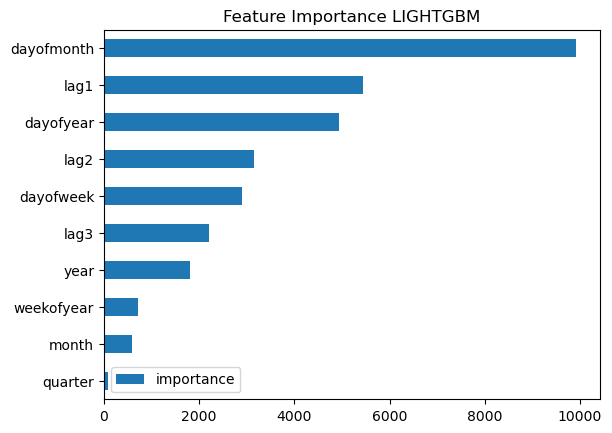

In [45]:
feature_names = reg_lightgbm.booster_.feature_name()  # Obtiene nombres desde el modelo interno de LightGBM
fi = pd.DataFrame(data=reg_lightgbm.feature_importances_,
                  index=feature_names,
                  columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance LIGHTGBM')
plt.show()


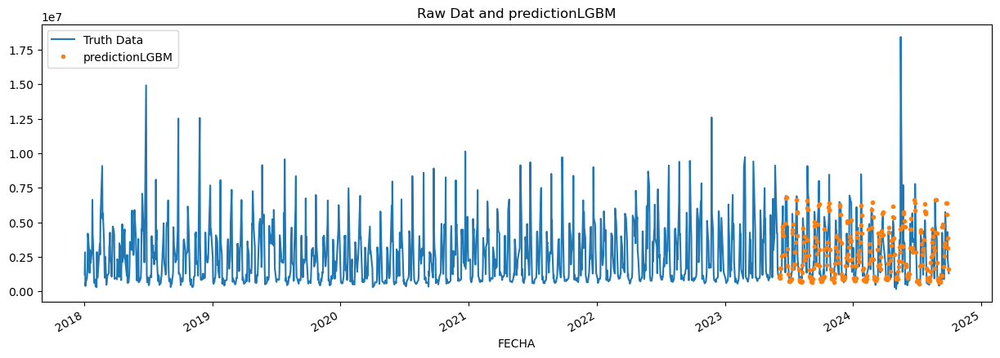

In [46]:
test = dataframes_test[0].copy()
df = dataframes[0].copy()
test['predictionLGBM'] = reg_lightgbm.predict(X_test)
df = df.merge(test[['predictionLGBM']], how='left', left_index=True, right_index=True)
ax = df[['CHU_COPA_AJUST']].plot(figsize=(15, 5))
df['predictionLGBM'].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'predictionLGBM'])
ax.set_title('Raw Dat and predictionLGBM')
plt.show()

In [47]:
score = np.sqrt(mean_squared_error(test['CHU_COPA_AJUST'], test['predictionLGBM']))
print(f'RMSE en conjunto de Test Modelo LGBM: {score:0.2f}')

RMSE en conjunto de Test Modelo LGBM: 1514976.14


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

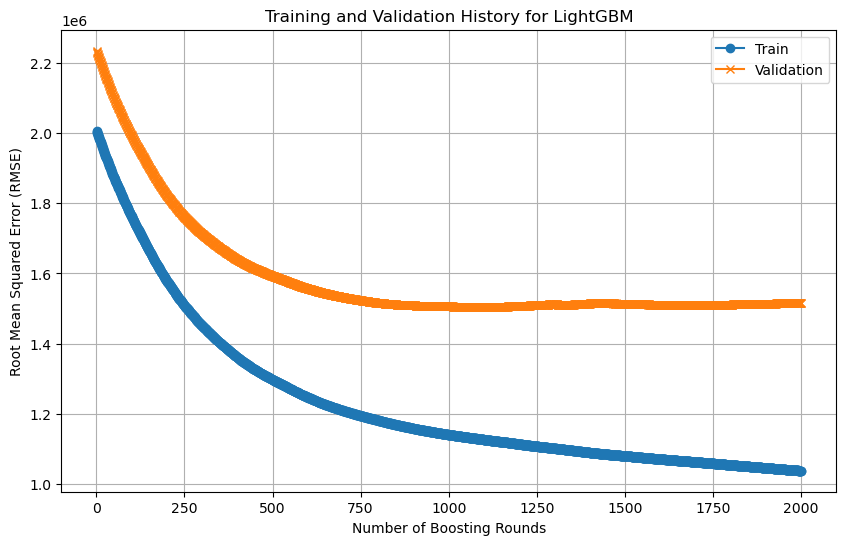

In [48]:
reg_lightgbm.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    eval_metric="rmse",  # Especifica RMSE como métrica
    #early_stopping_rounds=50,
    #verbose=False
)


# Obtener los resultados de evaluación del modelo
results = reg_lightgbm.evals_result_  # 'reg_lightgbm' es tu modelo LightGBM entrenado

# Extraer los errores de entrenamiento y validación
train_error = results['training']['rmse']  # Asumiendo que usaste RMSE como métrica
val_error = results['valid_1']['rmse']  # 'valid_1' corresponde al conjunto de validación

# Número de rondas de boosting
epoch = range(1, len(train_error) + 1)

# Crear el gráfico
plt.figure(figsize=(10, 6))
plt.plot(epoch, train_error, label='Train', marker='o')
plt.plot(epoch, val_error, label='Validation', marker='x')
plt.xlabel('Number of Boosting Rounds')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('Training and Validation History for LightGBM')
plt.legend()
plt.grid()
plt.show()


In [ ]:
tss = TimeSeriesSplit(n_splits=5, test_size=24*365*1, gap=24)
df = df.sort_index()


fold = 0
preds = []
scores = []
for train_idx, val_idx in tss.split(df):
    train = df.iloc[train_idx]
    test = df.iloc[val_idx]

    

    FEATURES = ['dayofyear', 'hour', 'dayofweek', 'quarter', 'month','year',
                'lag1','lag2','lag3']
    TARGET = 'PJME_MW'

    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]

    reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',
                           n_estimators=1000,
                           early_stopping_rounds=50,
                           objective='reg:linear',
                           max_depth=3,
                           learning_rate=0.01)
    reg.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)],
            verbose=100)

    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

In [60]:
reg_lightgbm = lgb.LGBMRegressor(**study.best_params )
reg_lightgbm.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

LGBMRegressor(colsample_bytree=0.7872028375570493,
              learning_rate=0.03649887853594716, max_depth=3,
              min_child_samples=32, n_estimators=704, num_leaves=94,
              reg_alpha=0.11660832838554644, reg_lambda=0.7771493750262098,
              subsample=0.8961382533134812)

,CHU_COPA_AJUST,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
FECHA,,,,,,,,,,,
2018-01-02,"1,211,928.17",1,1,1,2018,2,2,1,NaN,NaN,NaN
2018-01-03,"2,830,481.92",2,1,1,2018,3,3,1,NaN,NaN,NaN
2018-01-04,"387,205.10",3,1,1,2018,4,4,1,NaN,NaN,NaN
2018-01-05,"695,554.06",4,1,1,2018,5,5,1,NaN,NaN,NaN
2018-01-08,"862,726.10",0,1,1,2018,8,8,2,NaN,NaN,NaN


In [58]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error



df = dataframes[0].copy()

def objective(trial):
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 500, 2000),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 100),
        "subsample": trial.suggest_uniform("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 0.01, 1.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 0.01, 1.0),
        "random_state": 42,
    }

    test_size = 100
    tss = TimeSeriesSplit(n_splits=5, test_size=test_size, gap=10)
    scores = []

    for train_idx, val_idx in tss.split(df):
        train = df.iloc[train_idx]
        test = df.iloc[val_idx]

        FEATURES = ['dayofyear', 'dayofweek', 'quarter', 'month', 'year',
                    'lag1', 'lag2', 'lag3']
        TARGET = 'CHU_COPA_AJUST'

        # Verificar características y dropna
        assert all(feature in train.columns for feature in FEATURES), "Faltan columnas en train"
        assert all(feature in test.columns for feature in FEATURES), "Faltan columnas en test"

        X_train = train[FEATURES].dropna()
        y_train = train[TARGET].loc[X_train.index]
        X_test = test[FEATURES].dropna()
        y_test = test[TARGET].loc[X_test.index]

        if X_train.empty or X_test.empty:
            raise ValueError("X_train o X_test está vacío después de dropna")

        model = lgb.LGBMRegressor(**param, early_stopping_rounds=50)
        model.fit(
            X_train, y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="rmse",
            
        )

        y_pred = model.predict(X_test)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        scores.append(rmse)

    return np.mean(scores)


# Ejecutar la optimización con Optuna
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=100)


[I 2024-11-17 10:19:36,029] A new study created in memory with name: no-name-c24b844a-f294-4480-ac11-d4f66aed06c7


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:36,444] Trial 0 finished with value: 1693383.184244041 and parameters: {'n_estimators': 1510, 'learning_rate': 0.0182188821429844, 'max_depth': 4, 'num_leaves': 44, 'min_child_samples': 47, 'subsample': 0.6892017153870077, 'colsample_bytree': 0.5429623766175318, 'reg_alpha': 0.03356372667735802, 'reg_lambda': 0.0979680468388694}. Best is trial 0 with value: 1693383.184244041.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:38,796] Trial 1 finished with value: 1772955.9389778592 and parameters: {'n_estimators': 869, 'learning_rate': 0.0011336618063044126, 'max_depth': 8, 'num_leaves': 144, 'min_child_samples': 17, 'subsample': 0.8159675978770065, 'colsample_bytree': 0.8837124299367138, 'reg_alpha': 0.017163469022317426, 'reg_lambda': 0.025208706835529046}. Best is trial 0 with value: 1693383.184244041.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:39,320] Trial 2 finished with value: 1695628.2620431662 and parameters: {'n_estimators': 1380, 'learning_rate': 0.016614789849503212, 'max_depth': 3, 'num_leaves': 100, 'min_child_samples': 62, 'subsample': 0.5689040104470926, 'colsample_bytree': 0.5982975231695781, 'reg_alpha': 0.09521010610952621, 'reg_lambda': 0.18545019145797748}. Best is trial 0 with value: 1693383.184244041.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[147]	valid_0's rmse: 2.45215e+06	valid_0's l2: 6.01303e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightG

[I 2024-11-17 10:19:41,043] Trial 3 finished with value: 1696506.9240852066 and parameters: {'n_estimators': 1251, 'learning_rate': 0.0016112701841743758, 'max_depth': 4, 'num_leaves': 22, 'min_child_samples': 44, 'subsample': 0.8461291168912385, 'colsample_bytree': 0.8204538338560595, 'reg_alpha': 0.017346943668394742, 'reg_lambda': 0.3829981598552334}. Best is trial 0 with value: 1693383.184244041.
[I 2024-11-17 10:19:41,246] Trial 4 finished with value: 1687559.96169958 and parameters: {'n_estimators': 1096, 'learning_rate': 0.09550679561251653, 'max_depth': 4, 'num_leaves': 117, 'min_child_samples': 90, 'subsample': 0.8580157629276992, 'colsample_bytree': 0.7860373026073705, 'reg_alpha': 0.6635264846569369, 'reg_lambda': 0.4169314425047909}. Best is trial 4 with value: 1687559.96169958.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[I 2024-11-17 10:19:42,226] Trial 5 finished with value: 1769496.7263413717 and parameters: {'n_estimators': 780, 'learning_rate': 0.0015878157892890885, 'max_depth': 9, 'num_leaves': 22, 'min_child_samples': 70, 'subsample': 0.785830116602425, 'colsample_bytree': 0.9555477451676685, 'reg_alpha': 0.010490466846557652, 'reg_lambda': 0.4498354705624924}. Best is trial 4 with value: 1687559.96169958.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:42,910] Trial 6 finished with value: 1680940.9975647186 and parameters: {'n_estimators': 1195, 'learning_rate': 0.005646718951927204, 'max_depth': 7, 'num_leaves': 112, 'min_child_samples': 46, 'subsample': 0.809829124155697, 'colsample_bytree': 0.8129958190440894, 'reg_alpha': 0.1772563330114604, 'reg_lambda': 0.14352047308274185}. Best is trial 6 with value: 1680940.9975647186.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:43,986] Trial 7 finished with value: 1677083.320556879 and parameters: {'n_estimators': 1953, 'learning_rate': 0.004072943852275465, 'max_depth': 4, 'num_leaves': 72, 'min_child_samples': 31, 'subsample': 0.6962448847083786, 'colsample_bytree': 0.9618637661086421, 'reg_alpha': 0.014585581793308974, 'reg_lambda': 0.02238899030305289}. Best is trial 7 with value: 1677083.320556879.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:44,366] Trial 8 finished with value: 1684612.3550057425 and parameters: {'n_estimators': 1894, 'learning_rate': 0.013646381526165069, 'max_depth': 7, 'num_leaves': 60, 'min_child_samples': 76, 'subsample': 0.5815431155672284, 'colsample_bytree': 0.9055190025515372, 'reg_alpha': 0.46838202624150754, 'reg_lambda': 0.14562796444766096}. Best is trial 7 with value: 1677083.320556879.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:44,915] Trial 9 finished with value: 1665933.3438747837 and parameters: {'n_estimators': 883, 'learning_rate': 0.010718800140597695, 'max_depth': 3, 'num_leaves': 147, 'min_child_samples': 35, 'subsample': 0.6645126660892983, 'colsample_bytree': 0.8256037027274887, 'reg_alpha': 0.03663879690487707, 'reg_lambda': 0.035603385835587385}. Best is trial 9 with value: 1665933.3438747837.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:45,385] Trial 10 finished with value: 1726968.5960393143 and parameters: {'n_estimators': 554, 'learning_rate': 0.05777212102507267, 'max_depth': 10, 'num_leaves': 148, 'min_child_samples': 10, 'subsample': 0.9555710248997296, 'colsample_bytree': 0.6722604277486458, 'reg_alpha': 0.05759078567693823, 'reg_lambda': 0.010700476489669885}. Best is trial 9 with value: 1665933.3438747837.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:46,705] Trial 11 finished with value: 1666589.779859408 and parameters: {'n_estimators': 1971, 'learning_rate': 0.004562585573394132, 'max_depth': 5, 'num_leaves': 75, 'min_child_samples': 27, 'subsample': 0.6830488040055486, 'colsample_bytree': 0.9803296898843081, 'reg_alpha': 0.03642792804786548, 'reg_lambda': 0.038447516381160625}. Best is trial 9 with value: 1665933.3438747837.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:47,822] Trial 12 finished with value: 1671186.0154751637 and parameters: {'n_estimators': 1671, 'learning_rate': 0.004942850831793568, 'max_depth': 6, 'num_leaves': 88, 'min_child_samples': 28, 'subsample': 0.6384478701628186, 'colsample_bytree': 0.6905780263740255, 'reg_alpha': 0.039896269793171645, 'reg_lambda': 0.0471561349569173}. Best is trial 9 with value: 1665933.3438747837.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:48,156] Trial 13 finished with value: 1664633.4462581074 and parameters: {'n_estimators': 876, 'learning_rate': 0.03356987274955366, 'max_depth': 5, 'num_leaves': 126, 'min_child_samples': 27, 'subsample': 0.7093059154719513, 'colsample_bytree': 0.9871829318831589, 'reg_alpha': 0.1755249389172082, 'reg_lambda': 0.05201946558952192}. Best is trial 13 with value: 1664633.4462581074.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:48,658] Trial 14 finished with value: 1657638.481672171 and parameters: {'n_estimators': 940, 'learning_rate': 0.03154271216692249, 'max_depth': 3, 'num_leaves': 131, 'min_child_samples': 37, 'subsample': 0.5083001425333262, 'colsample_bytree': 0.8782382854912815, 'reg_alpha': 0.24146165053448196, 'reg_lambda': 0.010020129965880592}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:49,130] Trial 15 finished with value: 1682833.1438970813 and parameters: {'n_estimators': 579, 'learning_rate': 0.033415319136726976, 'max_depth': 6, 'num_leaves': 122, 'min_child_samples': 19, 'subsample': 0.501587282758845, 'colsample_bytree': 0.8913551300964031, 'reg_alpha': 0.2678600443223382, 'reg_lambda': 0.011746572270183456}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[65]	valid_0's rmse: 1.44017e+06	valid_0's l2: 2.07409e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto

[I 2024-11-17 10:19:49,472] Trial 16 finished with value: 1674295.2225013168 and parameters: {'n_estimators': 939, 'learning_rate': 0.03164728178119216, 'max_depth': 5, 'num_leaves': 131, 'min_child_samples': 52, 'subsample': 0.5019698856401553, 'colsample_bytree': 0.8990884262898146, 'reg_alpha': 0.18961529113984402, 'reg_lambda': 0.06467277412689901}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[66]	valid_0's rmse: 2.42851e+06	valid_0's l2: 5.89767e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[I 2024-11-17 10:19:49,989] Trial 17 finished with value: 1673269.8830193654 and parameters: {'n_estimators': 747, 'learning_rate': 0.0365701093221815, 'max_depth': 5, 'num_leaves': 104, 'min_child_samples': 40, 'subsample': 0.9656179196514092, 'colsample_bytree': 0.9948641325449928, 'reg_alpha': 0.33186732111611217, 'reg_lambda': 0.7943320466736983}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:50,367] Trial 18 finished with value: 1686886.5085085682 and parameters: {'n_estimators': 1070, 'learning_rate': 0.09225931931066769, 'max_depth': 3, 'num_leaves': 134, 'min_child_samples': 60, 'subsample': 0.583238046928742, 'colsample_bytree': 0.7165099047885815, 'reg_alpha': 0.8919348268088271, 'reg_lambda': 0.015017560740841766}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:50,790] Trial 19 finished with value: 1669186.9175070426 and parameters: {'n_estimators': 1029, 'learning_rate': 0.025295959912289123, 'max_depth': 5, 'num_leaves': 94, 'min_child_samples': 22, 'subsample': 0.7622752700205389, 'colsample_bytree': 0.9360781646923756, 'reg_alpha': 0.12211772742200783, 'reg_lambda': 0.020088780024816174}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:51,502] Trial 20 finished with value: 1697941.5514111512 and parameters: {'n_estimators': 676, 'learning_rate': 0.05135313705213927, 'max_depth': 3, 'num_leaves': 130, 'min_child_samples': 97, 'subsample': 0.8858315581472986, 'colsample_bytree': 0.8571919767832044, 'reg_alpha': 0.0791112776378672, 'reg_lambda': 0.08589256907909604}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:52,327] Trial 21 finished with value: 1659055.1872496358 and parameters: {'n_estimators': 902, 'learning_rate': 0.009432691059144772, 'max_depth': 3, 'num_leaves': 148, 'min_child_samples': 37, 'subsample': 0.6394706448297219, 'colsample_bytree': 0.7751734774793853, 'reg_alpha': 0.13783806169217078, 'reg_lambda': 0.038668753585308614}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:53,044] Trial 22 finished with value: 1666454.983931375 and parameters: {'n_estimators': 969, 'learning_rate': 0.006846766024010141, 'max_depth': 4, 'num_leaves': 136, 'min_child_samples': 36, 'subsample': 0.6245751622224844, 'colsample_bytree': 0.7710149676771015, 'reg_alpha': 0.15252421427187932, 'reg_lambda': 0.05527973125236424}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:53,836] Trial 23 finished with value: 1675275.029759905 and parameters: {'n_estimators': 1182, 'learning_rate': 0.008556645671670894, 'max_depth': 3, 'num_leaves': 121, 'min_child_samples': 54, 'subsample': 0.7346851994876485, 'colsample_bytree': 0.7344004624469095, 'reg_alpha': 0.3931193903734542, 'reg_lambda': 0.030844638435993752}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:54,436] Trial 24 finished with value: 1701269.693943811 and parameters: {'n_estimators': 794, 'learning_rate': 0.022957443432988636, 'max_depth': 6, 'num_leaves': 108, 'min_child_samples': 12, 'subsample': 0.537322944666502, 'colsample_bytree': 0.8586928340208305, 'reg_alpha': 0.2277173476998618, 'reg_lambda': 0.017065234176508716}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[64]	valid_0's rmse: 2.54831e+06	valid_0's l2: 6.49386e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto

[I 2024-11-17 10:19:54,748] Trial 25 finished with value: 1664572.9391205728 and parameters: {'n_estimators': 665, 'learning_rate': 0.052485700830803124, 'max_depth': 4, 'num_leaves': 138, 'min_child_samples': 26, 'subsample': 0.7326858387908308, 'colsample_bytree': 0.9262639592131807, 'reg_alpha': 0.06854932166848855, 'reg_lambda': 0.07065454915268479}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:55,228] Trial 26 finished with value: 1663710.0269075027 and parameters: {'n_estimators': 666, 'learning_rate': 0.05658214277923085, 'max_depth': 3, 'num_leaves': 139, 'min_child_samples': 37, 'subsample': 0.6165024966888842, 'colsample_bytree': 0.637226008869771, 'reg_alpha': 0.06273968644904941, 'reg_lambda': 0.22446563910175213}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:55,498] Trial 27 finished with value: 1668891.037094453 and parameters: {'n_estimators': 511, 'learning_rate': 0.06613739893775088, 'max_depth': 3, 'num_leaves': 141, 'min_child_samples': 38, 'subsample': 0.616660266760659, 'colsample_bytree': 0.6028697623405819, 'reg_alpha': 0.11520273195299018, 'reg_lambda': 0.24619942351374394}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:56,540] Trial 28 finished with value: 1719119.696575436 and parameters: {'n_estimators': 668, 'learning_rate': 0.0031487817317989593, 'max_depth': 3, 'num_leaves': 148, 'min_child_samples': 51, 'subsample': 0.5436630616253438, 'colsample_bytree': 0.6479953730388841, 'reg_alpha': 0.05407293084184095, 'reg_lambda': 0.9642275861385547}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:57,225] Trial 29 finished with value: 1688432.7896825797 and parameters: {'n_estimators': 1470, 'learning_rate': 0.016656936785352842, 'max_depth': 4, 'num_leaves': 53, 'min_child_samples': 42, 'subsample': 0.6558314086407157, 'colsample_bytree': 0.5307988116102205, 'reg_alpha': 0.29198472577718626, 'reg_lambda': 0.12120944389678052}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:19:57,859] Trial 30 finished with value: 1664079.6139449456 and parameters: {'n_estimators': 1294, 'learning_rate': 0.011304234910640757, 'max_depth': 3, 'num_leaves': 114, 'min_child_samples': 34, 'subsample': 0.599554122923073, 'colsample_bytree': 0.565415407069373, 'reg_alpha': 0.5404865956122525, 'reg_lambda': 0.26656621274663306}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:58,566] Trial 31 finished with value: 1658041.4635588885 and parameters: {'n_estimators': 1462, 'learning_rate': 0.011126884912339364, 'max_depth': 3, 'num_leaves': 115, 'min_child_samples': 32, 'subsample': 0.6066878353302673, 'colsample_bytree': 0.5715411124805955, 'reg_alpha': 0.615140823641868, 'reg_lambda': 0.32755570521498384}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:19:59,260] Trial 32 finished with value: 1691903.2606392733 and parameters: {'n_estimators': 1612, 'learning_rate': 0.021108642162622333, 'max_depth': 4, 'num_leaves': 127, 'min_child_samples': 49, 'subsample': 0.5402520166067941, 'colsample_bytree': 0.5137023798470837, 'reg_alpha': 0.7145966649466976, 'reg_lambda': 0.6549858061757948}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:00,257] Trial 33 finished with value: 1693650.285440912 and parameters: {'n_estimators': 1364, 'learning_rate': 0.008033259439166222, 'max_depth': 3, 'num_leaves': 139, 'min_child_samples': 60, 'subsample': 0.5634195942207822, 'colsample_bytree': 0.6063637791605312, 'reg_alpha': 0.08670098820057984, 'reg_lambda': 0.23435408031621552}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:02,515] Trial 34 finished with value: 1671541.349479671 and parameters: {'n_estimators': 1700, 'learning_rate': 0.002775513465115433, 'max_depth': 4, 'num_leaves': 98, 'min_child_samples': 22, 'subsample': 0.6115638656723968, 'colsample_bytree': 0.6347975889952067, 'reg_alpha': 0.12833031850920243, 'reg_lambda': 0.34963366195576545}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:03,281] Trial 35 finished with value: 1681580.6357368291 and parameters: {'n_estimators': 1529, 'learning_rate': 0.013283511773173017, 'max_depth': 8, 'num_leaves': 150, 'min_child_samples': 45, 'subsample': 0.6548322943068939, 'colsample_bytree': 0.5763906844579599, 'reg_alpha': 0.9517639468245879, 'reg_lambda': 0.5433766596238759}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[126]	valid_0's rmse: 1.45553e+06	valid_0's l2: 2.11858e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000123 s

[I 2024-11-17 10:20:03,836] Trial 36 finished with value: 1680562.0087056875 and parameters: {'n_estimators': 1145, 'learning_rate': 0.07842866303721888, 'max_depth': 3, 'num_leaves': 122, 'min_child_samples': 16, 'subsample': 0.5298698087740638, 'colsample_bytree': 0.5532654010408976, 'reg_alpha': 0.3988528079188967, 'reg_lambda': 0.3113617216586715}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:04,336] Trial 37 finished with value: 1664346.7893522207 and parameters: {'n_estimators': 1019, 'learning_rate': 0.015796315334032147, 'max_depth': 4, 'num_leaves': 141, 'min_child_samples': 32, 'subsample': 0.5666621813185363, 'colsample_bytree': 0.7815963662064755, 'reg_alpha': 0.564047098231807, 'reg_lambda': 0.18094163222576432}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:04,745] Trial 38 finished with value: 1698142.930141714 and parameters: {'n_estimators': 775, 'learning_rate': 0.04066340324316709, 'max_depth': 3, 'num_leaves': 34, 'min_child_samples': 65, 'subsample': 0.5970801118048682, 'colsample_bytree': 0.6890236091715097, 'reg_alpha': 0.22940287807261678, 'reg_lambda': 0.11262310172871393}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:05,238] Trial 39 finished with value: 1666097.6344586383 and parameters: {'n_estimators': 1319, 'learning_rate': 0.02629901885839035, 'max_depth': 4, 'num_leaves': 116, 'min_child_samples': 40, 'subsample': 0.6743097924786654, 'colsample_bytree': 0.749223211802023, 'reg_alpha': 0.022063995534470377, 'reg_lambda': 0.02771977748297052}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:06,039] Trial 40 finished with value: 1684931.4298191457 and parameters: {'n_estimators': 1463, 'learning_rate': 0.006838888232183723, 'max_depth': 9, 'num_leaves': 110, 'min_child_samples': 78, 'subsample': 0.7133041611249462, 'colsample_bytree': 0.8134945536100167, 'reg_alpha': 0.04656709829682505, 'reg_lambda': 0.4876844143364372}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:06,871] Trial 41 finished with value: 1657922.7283825264 and parameters: {'n_estimators': 1276, 'learning_rate': 0.010977356968670386, 'max_depth': 3, 'num_leaves': 116, 'min_child_samples': 32, 'subsample': 0.6001076023272719, 'colsample_bytree': 0.5678954580437463, 'reg_alpha': 0.6046400037460747, 'reg_lambda': 0.2738864419089098}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[197]	valid_0's rmse: 1.44629e+06	valid_0's l2: 2.09176e+12
[Ligh

[I 2024-11-17 10:20:07,745] Trial 42 finished with value: 1675161.5434352716 and parameters: {'n_estimators': 1234, 'learning_rate': 0.010029066282274565, 'max_depth': 3, 'num_leaves': 133, 'min_child_samples': 45, 'subsample': 0.6385107651819263, 'colsample_bytree': 0.6313203406363671, 'reg_alpha': 0.02582802490614124, 'reg_lambda': 0.2119205400094991}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:08,535] Trial 43 finished with value: 1678914.8277775063 and parameters: {'n_estimators': 1125, 'learning_rate': 0.012684329094498202, 'max_depth': 3, 'num_leaves': 103, 'min_child_samples': 31, 'subsample': 0.5702677001603548, 'colsample_bytree': 0.5040179370974034, 'reg_alpha': 0.7654913174460709, 'reg_lambda': 0.15171316244347008}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[I 2024-11-17 10:20:09,246] Trial 44 finished with value: 1666469.773379989 and parameters: {'n_estimators': 1812, 'learning_rate': 0.01785986016173816, 'max_depth': 4, 'num_leaves': 142, 'min_child_samples': 37, 'subsample': 0.6345496563830463, 'colsample_bytree': 0.5858074694475413, 'reg_alpha': 0.43873644613057383, 'reg_lambda': 0.391533717976746}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[I 2024-11-17 10:20:10,550] Trial 45 finished with value: 1711523.262624889 and parameters: {'n_estimators': 945, 'learning_rate': 0.0037531563975741005, 'max_depth': 3, 'num_leaves': 77, 'min_child_samples': 23, 'subsample': 0.5135832760199651, 'colsample_bytree': 0.5505379750359207, 'reg_alpha': 0.10117450996539963, 'reg_lambda': 0.2882637687768132}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:10,988] Trial 46 finished with value: 1678280.9335067135 and parameters: {'n_estimators': 1390, 'learning_rate': 0.04612544563604705, 'max_depth': 4, 'num_leaves': 125, 'min_child_samples': 48, 'subsample': 0.5913143359111417, 'colsample_bytree': 0.6594799070104354, 'reg_alpha': 0.580707075384092, 'reg_lambda': 0.08360585494675796}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:11,841] Trial 47 finished with value: 1658218.7625515359 and parameters: {'n_estimators': 856, 'learning_rate': 0.008538781723649351, 'max_depth': 3, 'num_leaves': 118, 'min_child_samples': 30, 'subsample': 0.555265301730584, 'colsample_bytree': 0.6112765001940426, 'reg_alpha': 0.3173232481440638, 'reg_lambda': 0.17690719897550586}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:12,999] Trial 48 finished with value: 1719915.3329752614 and parameters: {'n_estimators': 880, 'learning_rate': 0.006488126235379133, 'max_depth': 5, 'num_leaves': 88, 'min_child_samples': 15, 'subsample': 0.5519758992211438, 'colsample_bytree': 0.5299666761039366, 'reg_alpha': 0.33924946907498765, 'reg_lambda': 0.17488252737268686}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:14,958] Trial 49 finished with value: 1670287.2224656816 and parameters: {'n_estimators': 1541, 'learning_rate': 0.0021315286649884733, 'max_depth': 4, 'num_leaves': 118, 'min_child_samples': 32, 'subsample': 0.5186195480232142, 'colsample_bytree': 0.8550048632652755, 'reg_alpha': 0.2462074763474377, 'reg_lambda': 0.01004471996291648}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:16,428] Trial 50 finished with value: 1677674.4142501925 and parameters: {'n_estimators': 1055, 'learning_rate': 0.00879542044218942, 'max_depth': 8, 'num_leaves': 107, 'min_child_samples': 27, 'subsample': 0.5540051767699803, 'colsample_bytree': 0.6135038841424465, 'reg_alpha': 0.19098351798542706, 'reg_lambda': 0.13861626973563781}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:17,336] Trial 51 finished with value: 1673342.8167241688 and parameters: {'n_estimators': 832, 'learning_rate': 0.005743851770173813, 'max_depth': 3, 'num_leaves': 129, 'min_child_samples': 42, 'subsample': 0.6091592164450232, 'colsample_bytree': 0.5885619009130661, 'reg_alpha': 0.32773038936308213, 'reg_lambda': 0.19473003231387023}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:17,938] Trial 52 finished with value: 1657657.6817049775 and parameters: {'n_estimators': 616, 'learning_rate': 0.014478068042478694, 'max_depth': 3, 'num_leaves': 114, 'min_child_samples': 29, 'subsample': 0.5889047312615059, 'colsample_bytree': 0.6239319347394504, 'reg_alpha': 0.15074377083673207, 'reg_lambda': 0.32755681596644703}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:18,605] Trial 53 finished with value: 1657925.5123376406 and parameters: {'n_estimators': 743, 'learning_rate': 0.01135517514852159, 'max_depth': 3, 'num_leaves': 98, 'min_child_samples': 29, 'subsample': 0.579517640173478, 'colsample_bytree': 0.6774473737817988, 'reg_alpha': 0.13887449913078403, 'reg_lambda': 0.3474128338719493}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 463, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2529165.934665
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:19,119] Trial 54 finished with value: 1667921.9030363173 and parameters: {'n_estimators': 591, 'learning_rate': 0.013992394365828, 'max_depth': 3, 'num_leaves': 96, 'min_child_samples': 20, 'subsample': 0.5799804629212619, 'colsample_bytree': 0.7023004223737381, 'reg_alpha': 0.15634103104968305, 'reg_lambda': 0.5736776721091202}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:19,839] Trial 55 finished with value: 1658744.7523549094 and parameters: {'n_estimators': 725, 'learning_rate': 0.011472960958093905, 'max_depth': 3, 'num_leaves': 113, 'min_child_samples': 29, 'subsample': 0.5245234781321211, 'colsample_bytree': 0.6206801666925863, 'reg_alpha': 0.6435249596868892, 'reg_lambda': 0.3260596829690744}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:20,439] Trial 56 finished with value: 1680505.601857684 and parameters: {'n_estimators': 809, 'learning_rate': 0.020090679939197126, 'max_depth': 10, 'num_leaves': 82, 'min_child_samples': 25, 'subsample': 0.8405581927706132, 'colsample_bytree': 0.6699301083483722, 'reg_alpha': 0.4780049288821807, 'reg_lambda': 0.4591544512523621}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:21,786] Trial 57 finished with value: 1684244.7492740997 and parameters: {'n_estimators': 729, 'learning_rate': 0.004702606912581402, 'max_depth': 5, 'num_leaves': 101, 'min_child_samples': 19, 'subsample': 0.5007080151349319, 'colsample_bytree': 0.5744503002588423, 'reg_alpha': 0.8673042747395175, 'reg_lambda': 0.38498544286245284}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:22,614] Trial 58 finished with value: 1667926.4917256944 and parameters: {'n_estimators': 608, 'learning_rate': 0.007374528580897691, 'max_depth': 4, 'num_leaves': 92, 'min_child_samples': 33, 'subsample': 0.5840031036574385, 'colsample_bytree': 0.6535348544967204, 'reg_alpha': 0.21614427675325898, 'reg_lambda': 0.27802577567510434}. Best is trial 14 with value: 1657638.481672171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:23,199] Trial 59 finished with value: 1656802.8637132563 and parameters: {'n_estimators': 534, 'learning_rate': 0.028334093710486962, 'max_depth': 3, 'num_leaves': 118, 'min_child_samples': 29, 'subsample': 0.9126581501963729, 'colsample_bytree': 0.7190501259207542, 'reg_alpha': 0.27008661661221484, 'reg_lambda': 0.7566227320414036}. Best is trial 59 with value: 1656802.8637132563.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:23,660] Trial 60 finished with value: 1665511.9513804773 and parameters: {'n_estimators': 504, 'learning_rate': 0.029548234840944366, 'max_depth': 4, 'num_leaves': 107, 'min_child_samples': 25, 'subsample': 0.8708481171954201, 'colsample_bytree': 0.7182745976179902, 'reg_alpha': 0.17000324540858408, 'reg_lambda': 0.7005876787974714}. Best is trial 59 with value: 1656802.8637132563.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[I 2024-11-17 10:20:24,301] Trial 61 finished with value: 1657239.722354256 and parameters: {'n_estimators': 602, 'learning_rate': 0.015690385404448906, 'max_depth': 3, 'num_leaves': 119, 'min_child_samples': 29, 'subsample': 0.9371764336485555, 'colsample_bytree': 0.6784445336534687, 'reg_alpha': 0.28229386313355126, 'reg_lambda': 0.8126658620588301}. Best is trial 59 with value: 1656802.8637132563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:25,196] Trial 62 finished with value: 1701194.4689090173 and parameters: {'n_estimators': 620, 'learning_rate': 0.015266697368919127, 'max_depth': 7, 'num_leaves': 122, 'min_child_samples': 13, 'subsample': 0.9320751369813759, 'colsample_bytree': 0.6917397300390687, 'reg_alpha': 0.26937532763385824, 'reg_lambda': 0.8438212506856384}. Best is trial 59 with value: 1656802.8637132563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:25,715] Trial 63 finished with value: 1657345.1705596182 and parameters: {'n_estimators': 547, 'learning_rate': 0.01985178693419852, 'max_depth': 3, 'num_leaves': 112, 'min_child_samples': 34, 'subsample': 0.9052181711976759, 'colsample_bytree': 0.7507933216003884, 'reg_alpha': 0.20159541060648384, 'reg_lambda': 0.6211892101935352}. Best is trial 59 with value: 1656802.8637132563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:26,506] Trial 64 finished with value: 1655973.2649275367 and parameters: {'n_estimators': 554, 'learning_rate': 0.02401492262562903, 'max_depth': 3, 'num_leaves': 111, 'min_child_samples': 29, 'subsample': 0.922960727970566, 'colsample_bytree': 0.7395251159459699, 'reg_alpha': 0.10333746276461728, 'reg_lambda': 0.6478433358080103}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:27,162] Trial 65 finished with value: 1659782.9656308924 and parameters: {'n_estimators': 534, 'learning_rate': 0.02748043031391521, 'max_depth': 3, 'num_leaves': 111, 'min_child_samples': 35, 'subsample': 0.9949387995735706, 'colsample_bytree': 0.7562855683872262, 'reg_alpha': 0.10884176812775441, 'reg_lambda': 0.8995244255775975}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:28,426] Trial 66 finished with value: 1667569.5796061852 and parameters: {'n_estimators': 555, 'learning_rate': 0.02390194495749169, 'max_depth': 4, 'num_leaves': 125, 'min_child_samples': 40, 'subsample': 0.9217581476577612, 'colsample_bytree': 0.7942112796561999, 'reg_alpha': 0.20306768375766532, 'reg_lambda': 0.7110799551586454}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:30,522] Trial 67 finished with value: 1862488.4235100797 and parameters: {'n_estimators': 637, 'learning_rate': 0.001046448121840476, 'max_depth': 3, 'num_leaves': 104, 'min_child_samples': 23, 'subsample': 0.9046074418668816, 'colsample_bytree': 0.7309735238180499, 'reg_alpha': 0.3715171242530482, 'reg_lambda': 0.5917474150192262}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:33,615] Trial 68 finished with value: 1676672.174456555 and parameters: {'n_estimators': 560, 'learning_rate': 0.01910564824264108, 'max_depth': 4, 'num_leaves': 120, 'min_child_samples': 20, 'subsample': 0.95247815427704, 'colsample_bytree': 0.7092484873726923, 'reg_alpha': 0.09135110665536826, 'reg_lambda': 0.7298720553759436}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:34,260] Trial 69 finished with value: 1664249.6444753888 and parameters: {'n_estimators': 693, 'learning_rate': 0.03618668297936684, 'max_depth': 3, 'num_leaves': 134, 'min_child_samples': 42, 'subsample': 0.7953448136217226, 'colsample_bytree': 0.740858177511935, 'reg_alpha': 0.26657132125892624, 'reg_lambda': 0.981252403074445}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:35,229] Trial 70 finished with value: 1666577.8919127914 and parameters: {'n_estimators': 627, 'learning_rate': 0.03174158681409286, 'max_depth': 3, 'num_leaves': 129, 'min_child_samples': 35, 'subsample': 0.9819924102037374, 'colsample_bytree': 0.9633406858010061, 'reg_alpha': 0.07487498713459886, 'reg_lambda': 0.49612033785988147}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:36,742] Trial 71 finished with value: 1660322.6061933138 and parameters: {'n_estimators': 581, 'learning_rate': 0.02161878237707261, 'max_depth': 3, 'num_leaves': 111, 'min_child_samples': 28, 'subsample': 0.8944746302287527, 'colsample_bytree': 0.6824878833017971, 'reg_alpha': 0.13532767208743304, 'reg_lambda': 0.437727195583934}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:37,493] Trial 72 finished with value: 1663810.7114293869 and parameters: {'n_estimators': 705, 'learning_rate': 0.017903930713573848, 'max_depth': 3, 'num_leaves': 99, 'min_child_samples': 29, 'subsample': 0.9094454911914579, 'colsample_bytree': 0.8347016965839156, 'reg_alpha': 0.15826449773939547, 'reg_lambda': 0.6392674461640071}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:38,347] Trial 73 finished with value: 1659945.7138528507 and parameters: {'n_estimators': 774, 'learning_rate': 0.014869933604953832, 'max_depth': 3, 'num_leaves': 106, 'min_child_samples': 25, 'subsample': 0.9464039744486348, 'colsample_bytree': 0.6689933375340646, 'reg_alpha': 0.18314518225347054, 'reg_lambda': 0.8022501076845686}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:39,264] Trial 74 finished with value: 1663263.5102798347 and parameters: {'n_estimators': 652, 'learning_rate': 0.04040348730404947, 'max_depth': 3, 'num_leaves': 115, 'min_child_samples': 39, 'subsample': 0.8751501370159882, 'colsample_bytree': 0.7635962538819053, 'reg_alpha': 0.14996050183633278, 'reg_lambda': 0.5333761336177357}. Best is trial 64 with value: 1655973.2649275367.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:40,311] Trial 75 finished with value: 1654759.195989421 and parameters: {'n_estimators': 526, 'learning_rate': 0.012180624618465143, 'max_depth': 3, 'num_leaves': 92, 'min_child_samples': 30, 'subsample': 0.830429285163516, 'colsample_bytree': 0.7921368387487944, 'reg_alpha': 0.11250918003613919, 'reg_lambda': 0.6043587484251662}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:41,257] Trial 76 finished with value: 1661917.3643959346 and parameters: {'n_estimators': 528, 'learning_rate': 0.025290822792817413, 'max_depth': 4, 'num_leaves': 64, 'min_child_samples': 34, 'subsample': 0.8498562630946391, 'colsample_bytree': 0.8014419119000081, 'reg_alpha': 0.10543468457731167, 'reg_lambda': 0.8184519997421893}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:42,605] Trial 77 finished with value: 1662404.670560004 and parameters: {'n_estimators': 573, 'learning_rate': 0.01693391010792039, 'max_depth': 3, 'num_leaves': 123, 'min_child_samples': 22, 'subsample': 0.8336127973915222, 'colsample_bytree': 0.8719131812170466, 'reg_alpha': 0.010635514797227307, 'reg_lambda': 0.6275483533513888}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:43,646] Trial 78 finished with value: 1669552.56115417 and parameters: {'n_estimators': 500, 'learning_rate': 0.02012589781181417, 'max_depth': 4, 'num_leaves': 120, 'min_child_samples': 18, 'subsample': 0.934213756918725, 'colsample_bytree': 0.7276041690456417, 'reg_alpha': 0.12169057638667848, 'reg_lambda': 0.42185184060103564}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:45,647] Trial 79 finished with value: 1691912.507485453 and parameters: {'n_estimators': 600, 'learning_rate': 0.012901102670133682, 'max_depth': 3, 'num_leaves': 109, 'min_child_samples': 84, 'subsample': 0.9700591500090372, 'colsample_bytree': 0.7735503698857773, 'reg_alpha': 0.29150585857302996, 'reg_lambda': 0.9980242049655189}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:47,514] Trial 80 finished with value: 1663218.5887453917 and parameters: {'n_estimators': 1236, 'learning_rate': 0.02293159302377609, 'max_depth': 3, 'num_leaves': 91, 'min_child_samples': 31, 'subsample': 0.8160638645466044, 'colsample_bytree': 0.9185060149519578, 'reg_alpha': 0.22130086187872242, 'reg_lambda': 0.7350316225111472}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:50,845] Trial 81 finished with value: 1658242.0952513102 and parameters: {'n_estimators': 548, 'learning_rate': 0.009928237168303235, 'max_depth': 3, 'num_leaves': 85, 'min_child_samples': 29, 'subsample': 0.7627271443506873, 'colsample_bytree': 0.7030276057482533, 'reg_alpha': 0.1392447788981452, 'reg_lambda': 0.3546350988294443}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:51,837] Trial 82 finished with value: 1662822.6246070098 and parameters: {'n_estimators': 680, 'learning_rate': 0.011504847732056797, 'max_depth': 3, 'num_leaves': 102, 'min_child_samples': 26, 'subsample': 0.9155908418397178, 'colsample_bytree': 0.7454848296477102, 'reg_alpha': 0.07789904472456997, 'reg_lambda': 0.5256147399648942}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:52,615] Trial 83 finished with value: 1657716.7368323323 and parameters: {'n_estimators': 750, 'learning_rate': 0.02797833470021846, 'max_depth': 3, 'num_leaves': 96, 'min_child_samples': 37, 'subsample': 0.89293509305163, 'colsample_bytree': 0.7246633859608973, 'reg_alpha': 0.09356992687232164, 'reg_lambda': 0.6083062147116126}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:53,526] Trial 84 finished with value: 1665322.0348056986 and parameters: {'n_estimators': 642, 'learning_rate': 0.02886731740284539, 'max_depth': 9, 'num_leaves': 117, 'min_child_samples': 37, 'subsample': 0.8891606124979425, 'colsample_bytree': 0.756409499019057, 'reg_alpha': 0.08689936532328109, 'reg_lambda': 0.01260680781647794}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:55,743] Trial 85 finished with value: 1663556.5363181627 and parameters: {'n_estimators': 535, 'learning_rate': 0.032782222096662976, 'max_depth': 4, 'num_leaves': 128, 'min_child_samples': 34, 'subsample': 0.8627684380645098, 'colsample_bytree': 0.7244851700877891, 'reg_alpha': 0.06264582606600594, 'reg_lambda': 0.6207439054911608}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:20:56,525] Trial 86 finished with value: 1664896.6117450867 and parameters: {'n_estimators': 598, 'learning_rate': 0.046091782129174044, 'max_depth': 3, 'num_leaves': 113, 'min_child_samples': 42, 'subsample': 0.9319261249100975, 'colsample_bytree': 0.8280243952687087, 'reg_alpha': 0.17157004421137698, 'reg_lambda': 0.4698020640416555}. Best is trial 75 with value: 1654759.195989421.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[54]	valid_0's rmse: 2.4297e+06	valid_0's l2: 5.90346e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will

[I 2024-11-17 10:20:57,623] Trial 87 finished with value: 1653292.516727699 and parameters: {'n_estimators': 704, 'learning_rate': 0.03649887853594716, 'max_depth': 3, 'num_leaves': 94, 'min_child_samples': 32, 'subsample': 0.8961382533134812, 'colsample_bytree': 0.7872028375570493, 'reg_alpha': 0.11660832838554644, 'reg_lambda': 0.7771493750262098}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:20:59,723] Trial 88 finished with value: 1677671.6986178462 and parameters: {'n_estimators': 764, 'learning_rate': 0.03748056514922816, 'max_depth': 4, 'num_leaves': 81, 'min_child_samples': 47, 'subsample': 0.8990543396961335, 'colsample_bytree': 0.8006565271166729, 'reg_alpha': 0.09624492793520355, 'reg_lambda': 0.8564577649259314}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:21:00,769] Trial 89 finished with value: 1683715.1114764132 and parameters: {'n_estimators': 689, 'learning_rate': 0.06368087810590899, 'max_depth': 6, 'num_leaves': 89, 'min_child_samples': 56, 'subsample': 0.8764954455519843, 'colsample_bytree': 0.7680934431141482, 'reg_alpha': 0.11553755351411833, 'reg_lambda': 0.7599777585307003}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:21:02,420] Trial 90 finished with value: 1656898.8587285082 and parameters: {'n_estimators': 712, 'learning_rate': 0.04655963449430129, 'max_depth': 3, 'num_leaves': 75, 'min_child_samples': 36, 'subsample': 0.9636843521440752, 'colsample_bytree': 0.8436624331203919, 'reg_alpha': 0.24649969143026693, 'reg_lambda': 0.8955405391953539}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's rmse: 1.57344e+06	valid_0's l2: 2.47572e+12
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 se

[I 2024-11-17 10:21:02,927] Trial 91 finished with value: 1660639.0917366464 and parameters: {'n_estimators': 811, 'learning_rate': 0.042533045937165094, 'max_depth': 3, 'num_leaves': 95, 'min_child_samples': 38, 'subsample': 0.9714983571483099, 'colsample_bytree': 0.7871672868292338, 'reg_alpha': 0.24295055788961334, 'reg_lambda': 0.6762629949748159}. Best is trial 87 with value: 1653292.516727699.
[I 2024-11-17 10:21:03,641] Trial 92 finished with value: 1662145.824073587 and parameters: {'n_estimators': 923, 'learning_rate': 0.03556159040822632, 'max_depth': 3, 'num_leaves': 71, 'min_child_samples': 31, 'subsample': 0.9577227155578872, 'colsample_bytree': 0.8816690658421592, 'reg_alpha': 0.19414412497988512, 'reg_lambda': 0.9142335839083717}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:21:05,737] Trial 93 finished with value: 1659493.0838368684 and parameters: {'n_estimators': 645, 'learning_rate': 0.026217400750364394, 'max_depth': 3, 'num_leaves': 69, 'min_child_samples': 36, 'subsample': 0.9434236908505637, 'colsample_bytree': 0.8382739602895058, 'reg_alpha': 0.2688244386059929, 'reg_lambda': 0.5770545674580931}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:21:06,434] Trial 94 finished with value: 1658809.030283242 and parameters: {'n_estimators': 740, 'learning_rate': 0.05286992117113202, 'max_depth': 3, 'num_leaves': 75, 'min_child_samples': 27, 'subsample': 0.9263715846479055, 'colsample_bytree': 0.8081500217854074, 'reg_alpha': 0.1293623587131303, 'reg_lambda': 0.7992357854936549}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 627, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2600520.624801
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[I 2024-11-17 10:21:09,789] Trial 95 finished with value: 1663505.2969577461 and parameters: {'n_estimators': 845, 'learning_rate': 0.029666769775842813, 'max_depth': 3, 'num_leaves': 84, 'min_child_samples': 33, 'subsample': 0.9108327847232701, 'colsample_bytree': 0.9023175330907668, 'reg_alpha': 0.20597789210089412, 'reg_lambda': 0.021157208994931936}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2595073.968579
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:21:11,600] Trial 96 finished with value: 1672998.425082843 and parameters: {'n_estimators': 708, 'learning_rate': 0.022631584028576717, 'max_depth': 3, 'num_leaves': 78, 'min_child_samples': 44, 'subsample': 0.8813243724249121, 'colsample_bytree': 0.7383108666336664, 'reg_alpha': 0.16620827259804005, 'reg_lambda': 0.6826195357033656}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:21:15,349] Trial 97 finished with value: 1665899.1355702956 and parameters: {'n_estimators': 570, 'learning_rate': 0.01717872460006566, 'max_depth': 3, 'num_leaves': 93, 'min_child_samples': 39, 'subsample': 0.9958493381648196, 'colsample_bytree': 0.8444154642352694, 'reg_alpha': 0.295921980614517, 'reg_lambda': 0.5307800279635444}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-17 10:21:16,666] Trial 98 finished with value: 1665802.6716137207 and parameters: {'n_estimators': 614, 'learning_rate': 0.04728914758685892, 'max_depth': 4, 'num_leaves': 105, 'min_child_samples': 24, 'subsample': 0.8235175102327829, 'colsample_bytree': 0.7131439918144289, 'reg_alpha': 0.3710964949232048, 'reg_lambda': 0.8755089587127979}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 8
[LightGBM] [Warning] early_stopping_round is set=50, early_stopping_rounds=50 will be ignored. Current value: early_stopping_round=50
[LightGBM] [Info] Start training from score 2451618.422917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-11-17 10:21:17,431] Trial 99 finished with value: 1658827.9288307272 and parameters: {'n_estimators': 665, 'learning_rate': 0.06982314653167214, 'max_depth': 3, 'num_leaves': 52, 'min_child_samples': 30, 'subsample': 0.85958746316042, 'colsample_bytree': 0.8212655241746416, 'reg_alpha': 0.2433866626438224, 'reg_lambda': 0.04337108419734087}. Best is trial 87 with value: 1653292.516727699.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [54]:
dataframes[0].columns

Index(['CHU_COPA_AJUST', 'dayofweek', 'quarter', 'month', 'year', 'dayofyear',
       'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3'],
      dtype='object')

In [59]:
# Imprimir los mejores parámetros y el mejor RMSE
print("Mejores parámetros:", study.best_params)
print("Mejor RMSE promedio:", study.best_value)

Mejores parámetros: {'n_estimators': 704, 'learning_rate': 0.03649887853594716, 'max_depth': 3, 'num_leaves': 94, 'min_child_samples': 32, 'subsample': 0.8961382533134812, 'colsample_bytree': 0.7872028375570493, 'reg_alpha': 0.11660832838554644, 'reg_lambda': 0.7771493750262098}
Mejor RMSE promedio: 1653292.516727699


In [61]:
reg_lightgbm = lgb.LGBMRegressor(**study.best_params )
reg_lightgbm.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)])


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

LGBMRegressor(colsample_bytree=0.7872028375570493,
              learning_rate=0.03649887853594716, max_depth=3,
              min_child_samples=32, n_estimators=704, num_leaves=94,
              reg_alpha=0.11660832838554644, reg_lambda=0.7771493750262098,
              subsample=0.8961382533134812)

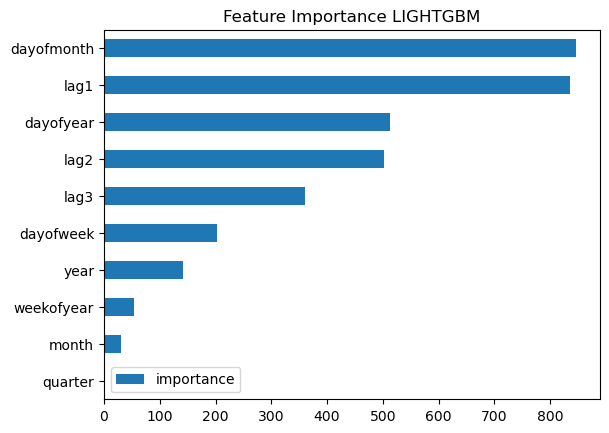

In [62]:
feature_names = reg_lightgbm.booster_.feature_name()  # Obtiene nombres desde el modelo interno de LightGBM
fi = pd.DataFrame(data=reg_lightgbm.feature_importances_,
                  index=feature_names,
                  columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance LIGHTGBM')
plt.show()


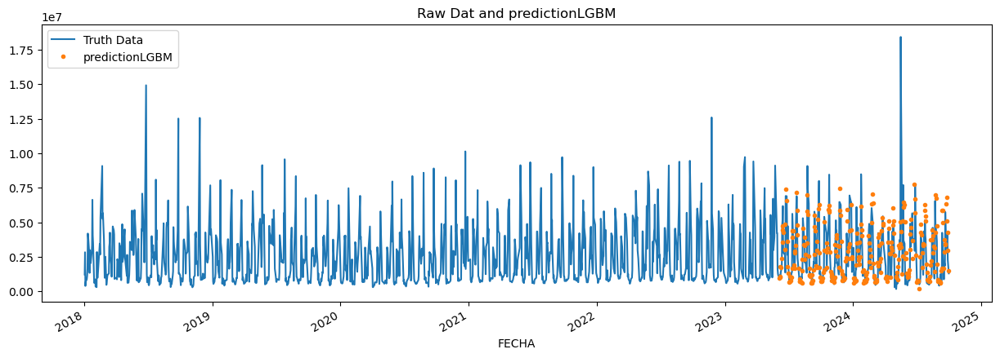

In [63]:
test = dataframes_test[0].copy()
df = dataframes[0].copy()
test['predictionLGBM'] = reg_lightgbm.predict(X_test)
df = df.merge(test[['predictionLGBM']], how='left', left_index=True, right_index=True)
ax = df[['CHU_COPA_AJUST']].plot(figsize=(15, 5))
df['predictionLGBM'].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'predictionLGBM'])
ax.set_title('Raw Dat and predictionLGBM')
plt.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1275, number of used features: 10
[LightGBM] [Info] Start training from score 2455439.954828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

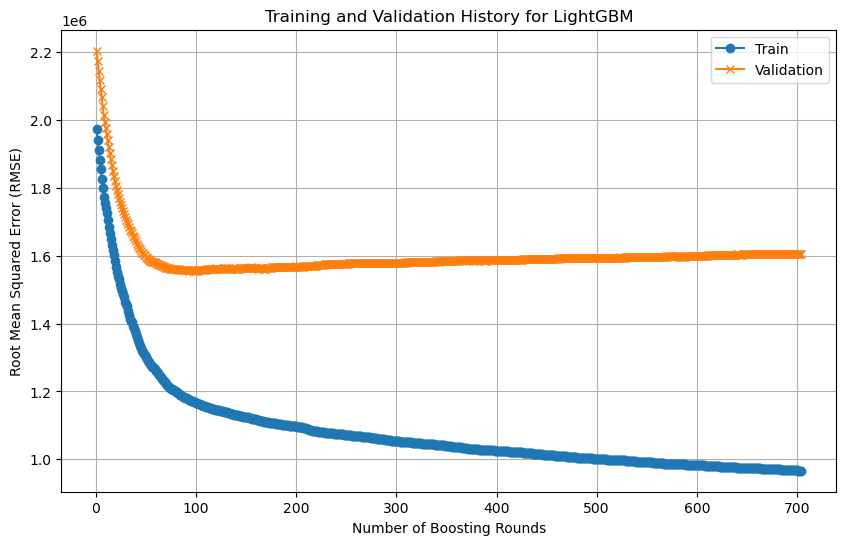

In [64]:
reg_lightgbm.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    eval_metric="rmse",  # Especifica RMSE como métrica
    #early_stopping_rounds=50,
    #verbose=False
)


# Obtener los resultados de evaluación del modelo
results = reg_lightgbm.evals_result_  # 'reg_lightgbm' es tu modelo LightGBM entrenado

# Extraer los errores de entrenamiento y validación
train_error = results['training']['rmse']  # Asumiendo que usaste RMSE como métrica
val_error = results['valid_1']['rmse']  # 'valid_1' corresponde al conjunto de validación

# Número de rondas de boosting
epoch = range(1, len(train_error) + 1)

# Crear el gráfico
plt.figure(figsize=(10, 6))
plt.plot(epoch, train_error, label='Train', marker='o')
plt.plot(epoch, val_error, label='Validation', marker='x')
plt.xlabel('Number of Boosting Rounds')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('Training and Validation History for LightGBM')
plt.legend()
plt.grid()
plt.show()


In [66]:
df.index.max()

Timestamp('2024-09-30 00:00:00')

In [74]:
future_df

,isFuture
2024-09-30,True
2024-10-01,True
2024-10-02,True
2024-10-03,True
2024-10-04,True
...,...
2024-12-27,True
2024-12-28,True
2024-12-29,True
2024-12-30,True


In [80]:
df_aux = df.copy()
df_aux.drop(columns=['dayofweek','quarter','month',	'year'	,'dayofyear'	,'dayofmonth',	'weekofyear'	,'lag1'	,'lag2'	,'lag3'	,'predictionLGBM'	,'isFuture'], inplace=True)

In [81]:
# Create future dataframe

future = pd.date_range('2024-09-30','2024-12-31', freq='1d')
future_df = pd.DataFrame(index=future)
future_df['isFuture'] = True
df_aux['isFuture'] = False
df_and_future = pd.concat([df_aux, future_df])


In [82]:
# Aplica la función al índice y concatena los resultados al DataFrame
time_features = df_and_future.index.to_series().apply(extract_time_features)
df_and_future = pd.concat([df_and_future, time_features], axis=1)

df_and_future = add_lags(df_and_future)

In [83]:
future_w_features = df_and_future.query('isFuture').copy()

In [84]:
future_w_features.head()

,CHU_COPA_AJUST,isFuture,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
2024-09-30,NaN,True,0,3,9,2024,274,30,40,"948,799.84","735,368.12","777,114.92"
2024-10-01,NaN,True,1,4,10,2024,275,1,40,"836,676.53","759,452.81","737,082.99"
2024-10-02,NaN,True,2,4,10,2024,276,2,40,"921,916.71","958,845.33","862,062.50"
2024-10-03,NaN,True,3,4,10,2024,277,3,40,"798,478.87","822,284.99","780,953.75"
2024-10-04,NaN,True,4,4,10,2024,278,4,40,"750,768.05",NaN,NaN


In [86]:
future_w_features['pred'] = reg_lightgbm.predict(future_w_features[FEATURES])

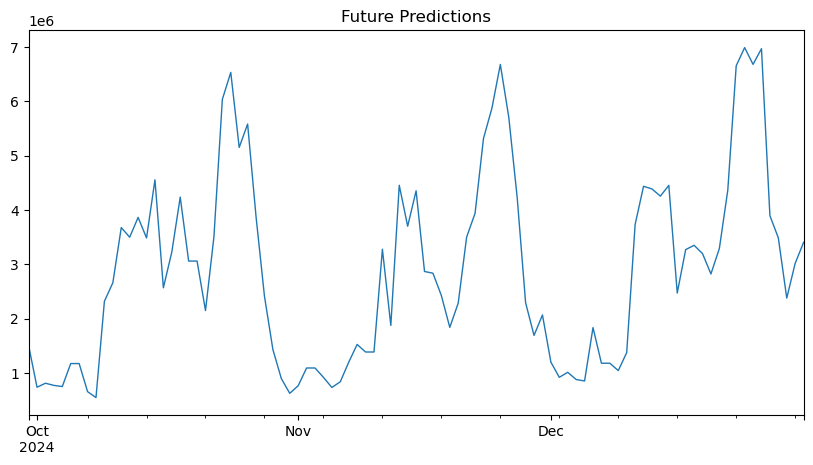

In [88]:
future_w_features['pred'].plot(figsize=(10, 5),
                               #color=color_pal[4],
                               ms=1,
                               lw=1,
                               title='Future Predictions')
plt.show()